Using /home/vzalevskyi/.cache/torch_extensions/py310_cu124 as PyTorch extensions root...
Detected CUDA files, patching ldflags
Emitting ninja build file /home/vzalevskyi/.cache/torch_extensions/py310_cu124/transform_convert_cuda/build.ninja...
/home/vzalevskyi/miniconda3/envs/fetalsyngen/lib/python3.10/site-packages/torch/utils/cpp_extension.py:1964: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Building extension module transform_convert_cuda...
Allowing ninja to set a default number of workers... (overridable by setting the environment variable MAX_JOBS=N)


ninja: no work to do.


Loading extension module transform_convert_cuda...
Using /home/vzalevskyi/.cache/torch_extensions/py310_cu124 as PyTorch extensions root...
Detected CUDA files, patching ldflags
Emitting ninja build file /home/vzalevskyi/.cache/torch_extensions/py310_cu124/slice_acq_cuda/build.ninja...
/home/vzalevskyi/miniconda3/envs/fetalsyngen/lib/python3.10/site-packages/torch/utils/cpp_extension.py:1964: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Building extension module slice_acq_cuda...
Allowing ninja to set a default number of workers... (overridable by setting the environment variable MAX_JOBS=N)
Loading extension module slice_acq_cuda...


ninja: no work to do.
Output max: 236.499755859375 min 0.0 std 22.3571834564209 mean 77.2308578491211 shape torch.Size([256, 256, 256])
Generation time: 0.5151660442352295
Image shape: torch.Size([256, 256, 256]), type: torch.float32, range: [0.0, 1.0], device: cpu
Label shape: torch.Size([256, 256, 256]), type: torch.float32, range: [0.0, 7.0], device: cpu


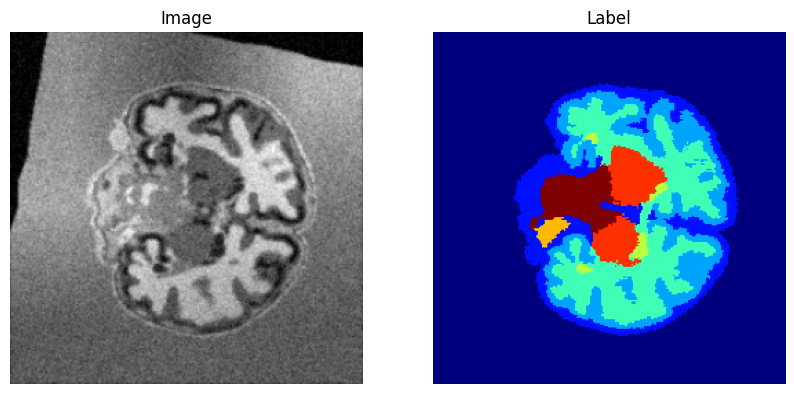

In [1]:
from pathlib import Path
import numpy as np
import torch
import hydra
from omegaconf import OmegaConf
import matplotlib.pyplot as plt


from fetalsyngen.data.datasets import FetalSynthDataset

from fetalsyngen.generator.model import FetalSynthGen
from fetalsyngen.generator.augmentation.synthseg import RandBiasField, RandGamma, RandNoise, RandResample
from fetalsyngen.generator.deformation.affine_nonrigid import  SpatialDeformation
from fetalsyngen.generator.intensity.rand_gmm import  ImageFromSeeds
def plot_imgs(data, slice=128):
    # print("Data keys:", data.keys())
    # if 'name' in data:
    #     print("Name:", data['name'])
    print('Generation time:', data['generation_params']['generation_time'])
    # print shape, type, range, device
    print(f"Image shape: {data['image'].shape}, type: {data['image'].dtype}, range: [{data['image'].min()}, {data['image'].max()}], device: {data['image'].device}")
    print(f"Label shape: {data['label'].shape}, type: {data['label'].dtype}, range: [{data['label'].min()}, {data['label'].max()}], device: {data['label'].device}")

    # if cuda tensor, move to cpu
    if data["image"].is_cuda:
        data["image"] = data["image"].cpu()
    if data["label"].is_cuda:
        data["label"] = data["label"].cpu()

    # remove channel dimension
    data["image"] = data["image"].squeeze()
    data["label"] = data["label"].squeeze()

    # plot image label
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(data["image"][:, slice, :], cmap="gray")
    axes[0].set_title("Image")
    axes[0].axis("off")
    axes[1].imshow(data["label"][:, slice, :], cmap='jet')
    axes[1].set_title("Label")
    axes[1].axis("off")
    plt.show()


def plot_sidebyside(s1, s2, test_name):
    print(f'Simple image generation time: {s1["generation_params"]["generation_time"]}')
    print(f'{test_name} image generation time: {s2["generation_params"]["generation_time"]}')
    img1, img2 = s1["image"], s2["image"]
    lab1, lab2 = s1["label"], s2["label"]

    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    axs[0, 0].imshow(img1[:, 128, :], cmap="gray")
    axs[0, 0].set_title("Simple image")
    axs[0, 0].axis("off")
    axs[0, 1].imshow(img2[:, 128, :], cmap="gray")
    axs[0, 1].set_title(f"{test_name} Test image")
    axs[0, 1].axis("off")
    axs[1, 0].imshow(lab1[:, 128, :], cmap="jet")
    axs[1, 0].set_title("Simple label")
    axs[1, 0].axis("off")
    axs[1, 1].imshow(lab2[:, 128, :], cmap="jet")
    axs[1, 1].set_title(f"{test_name} Test label")
    axs[1, 1].axis("off")
    plt.tight_layout()
    plt.show()


intensity_generator = ImageFromSeeds(
    min_subclusters=1,
    max_subclusters=6,
    seed_labels=[ 0, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,
    ],
    generation_classes=[
        0, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,
    ],
    meta_labels=4,
)
spatial_deform = SpatialDeformation(max_rotation=20, max_shear=0.02,max_scaling=0.1,
                                    size=(256, 256, 256), prob=1, nonlinear_transform=True,
                                    nonlin_scale_min=0.03, nonlin_scale_max=0.06,
                                    nonlin_std_max=4, flip_prb=0.5, device='cuda:0')
resampler = RandResample(prob=0.5, max_resolution=1.5, min_resolution=0.5)
bias_field = RandBiasField(prob=0.5, scale_min=0.004, scale_max=0.02, std_min=0.01, std_max=0.3)
noise = RandNoise(prob=0.5, std_min=5, std_max=15)
gamma = RandGamma(prob=0.5, gamma_std=0.1)

simple_synth_gen = generator = FetalSynthGen(shape=(256, 256, 256),
                          resolution=(0.5, 0.5, 0.5),
                          device='cuda:0',
                          intensity_generator=intensity_generator,
                          spatial_deform=spatial_deform,
                          resampler=resampler,
                          bias_field=bias_field,
                          noise=noise,
                          gamma=gamma,
                          )

simple_synth_ds = FetalSynthDataset(
    bids_path="./../data",
    generator=simple_synth_gen,
    seed_path="./../data/derivatives/seeds",
    sub_list=None,
)

for i in range(1):
    for j in range(1):
        plot_imgs(simple_synth_ds.sample_with_meta(j))

Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Generation time: 0.28698229789733887
Image shape: torch.Size([256, 256, 256]), type: torch.float32, range: [0.0, 1.0], device: cpu
Label shape: torch.Size([256, 256, 256]), type: torch.float32, range: [0.0, 7.0], device: cpu


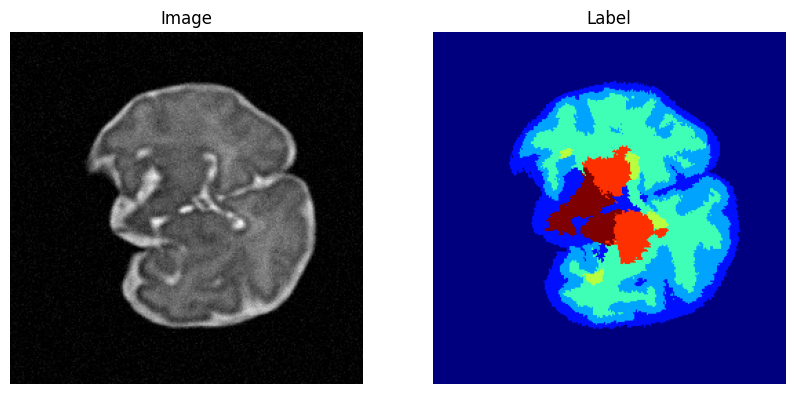

In [2]:
simple_real_ds = FetalSynthDataset(
    bids_path="./../data",
    generator=simple_synth_gen,
    seed_path=None,  # This makes the intensity generator to use the real image
    sub_list=None,
    load_image=True,  # This makes the intensity generator to use the real image
    image_as_intensity=True,  # This makes the intensity generator to use the real image
)
for i in range(1):
    for j in range(1):
        plot_imgs(simple_real_ds.sample_with_meta(j))

In [3]:
from fetalsyngen.generator.augmentation.artifacts import (
    BlurCortex,
    StructNoise,
    SimulateMotion,
    SimulatedBoundaries,
)
from fetalsyngen.generator.artifacts.utils import ScannerParams, ReconParams

## Cortex Blur

Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Simple image generation time: 0.31506967544555664
Blur Cortex image generation time: 0.31601834297180176


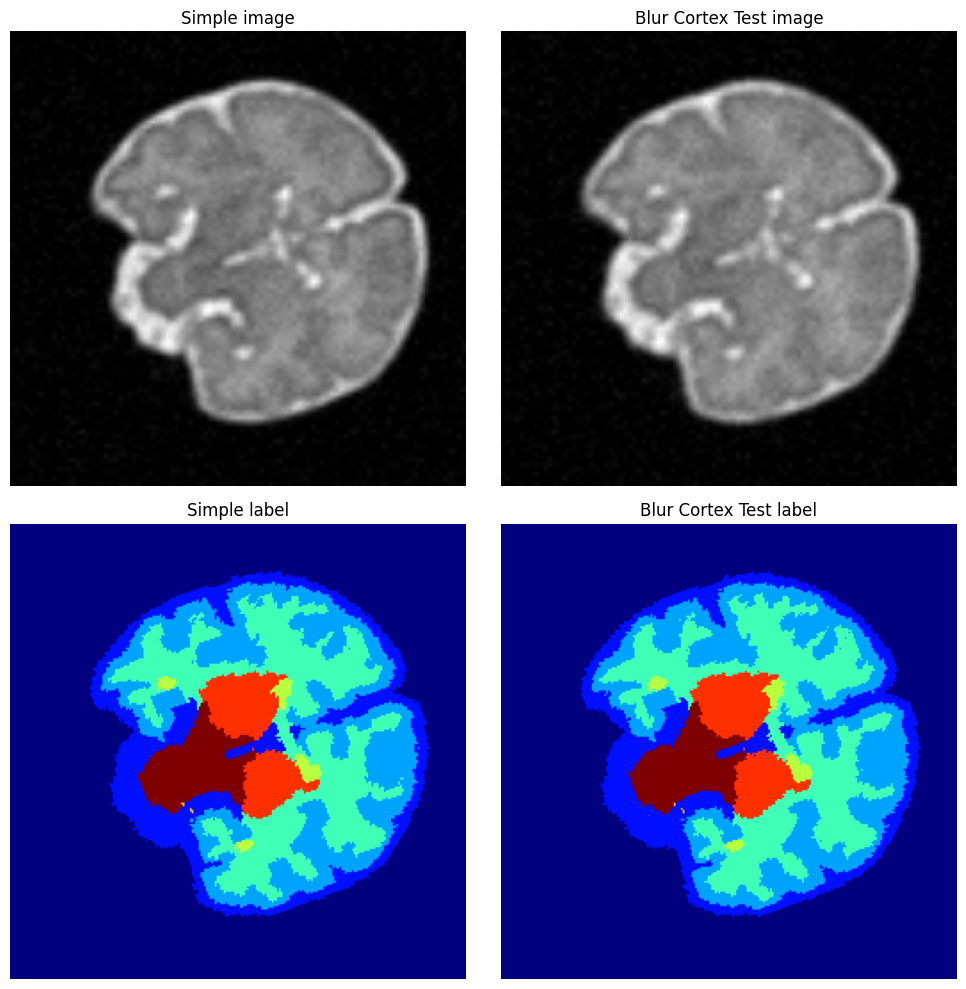

Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Simple image generation time: 0.2660231590270996
Blur Cortex image generation time: 0.26620912551879883


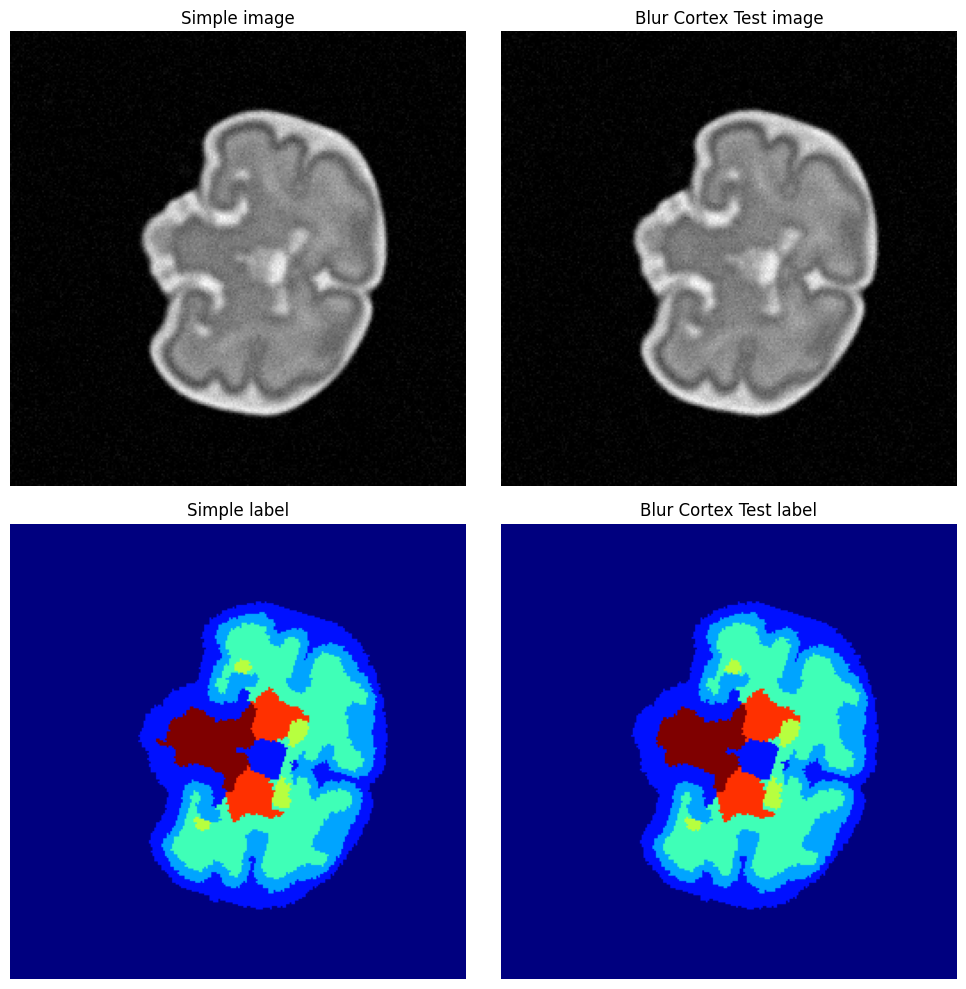

Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Simple image generation time: 0.2580277919769287
Blur Cortex image generation time: 0.2862839698791504


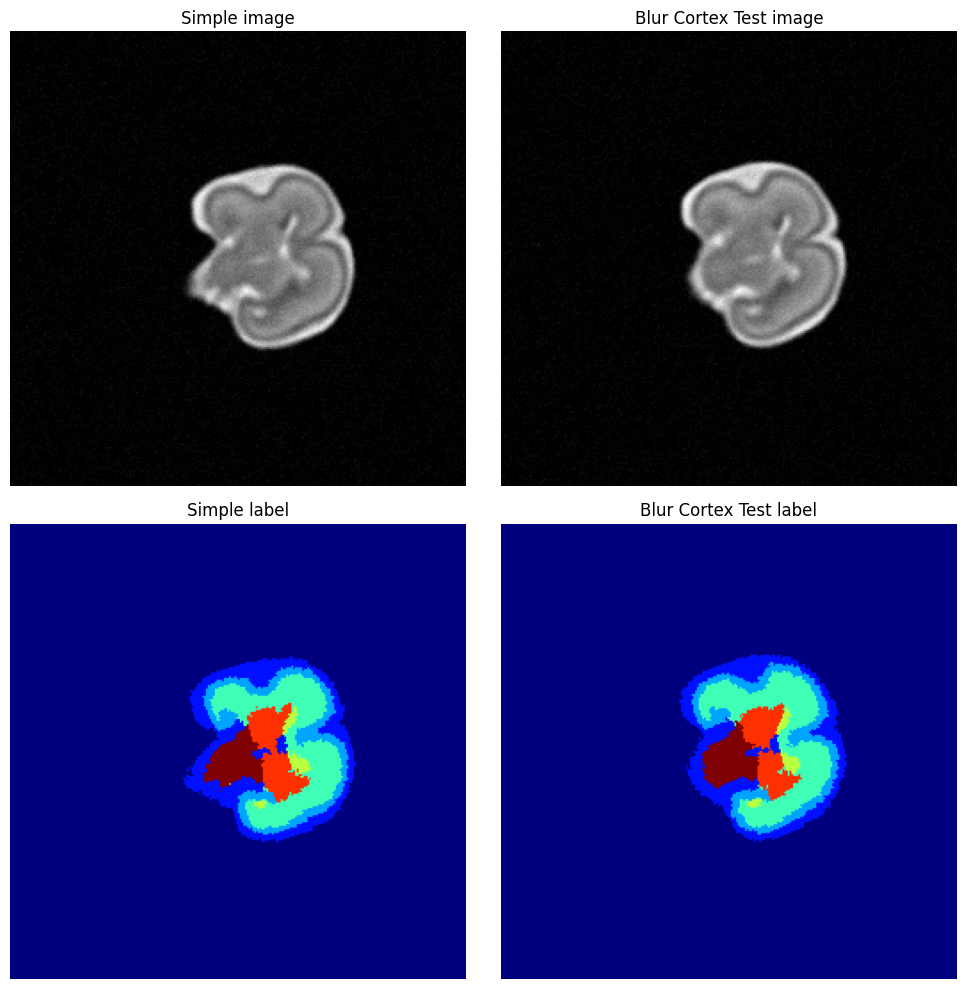

Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Simple image generation time: 0.26384639739990234
Blur Cortex image generation time: 0.25963354110717773


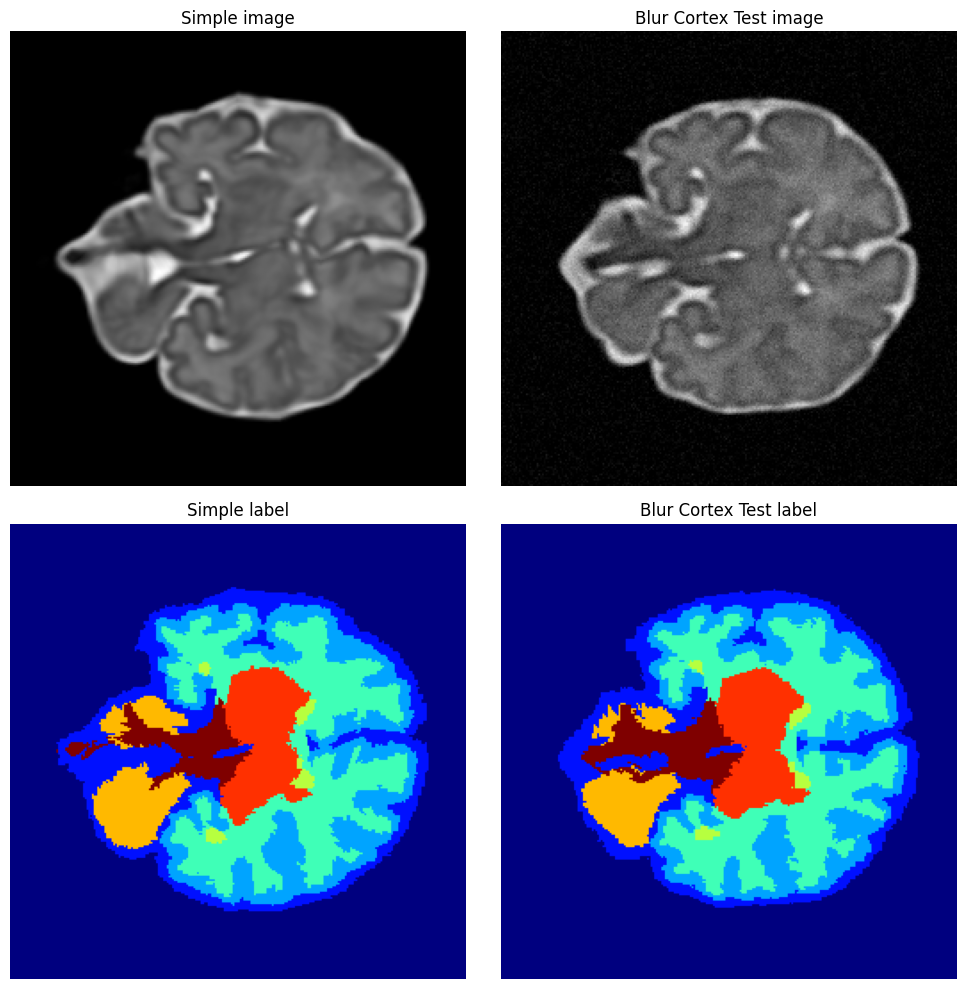

Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Simple image generation time: 0.31580543518066406
Blur Cortex image generation time: 0.3169426918029785


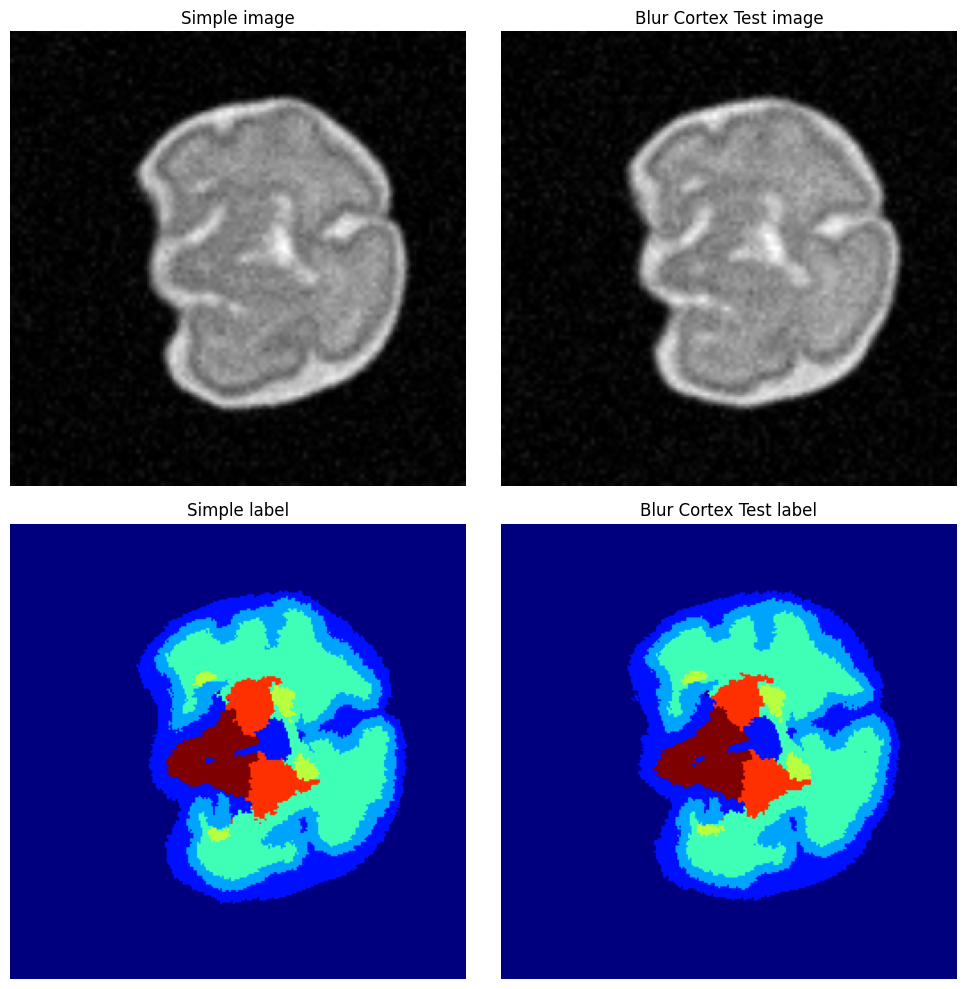

Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Simple image generation time: 0.3453545570373535
Blur Cortex image generation time: 0.36649060249328613


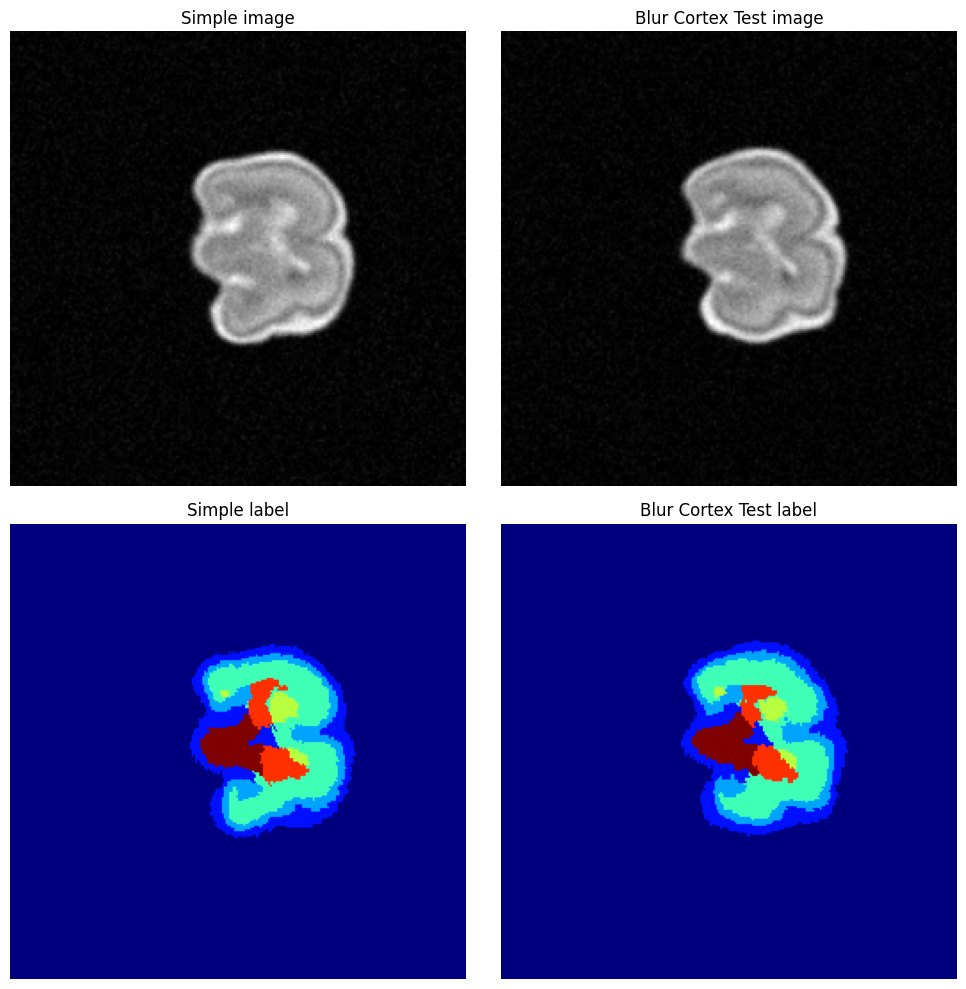

Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Simple image generation time: 0.293642520904541
Blur Cortex image generation time: 0.29050517082214355


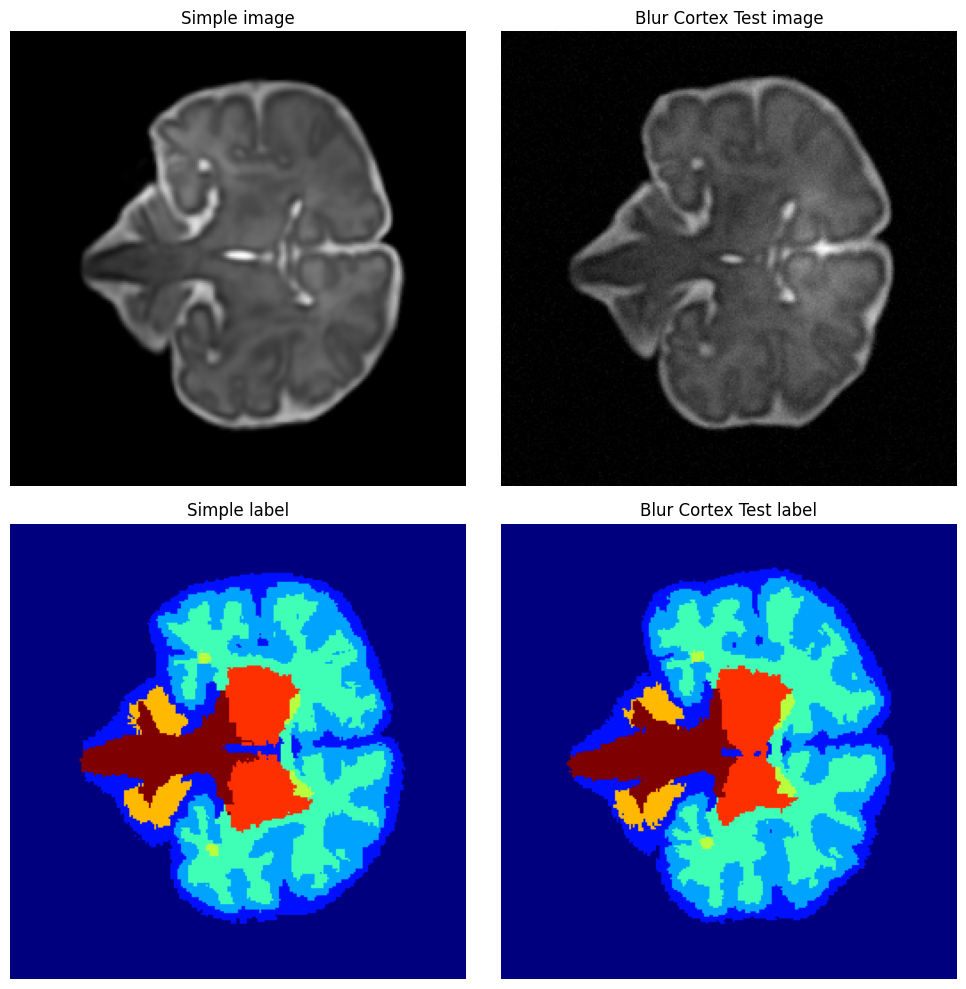

Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Simple image generation time: 0.2951052188873291
Blur Cortex image generation time: 0.2941422462463379


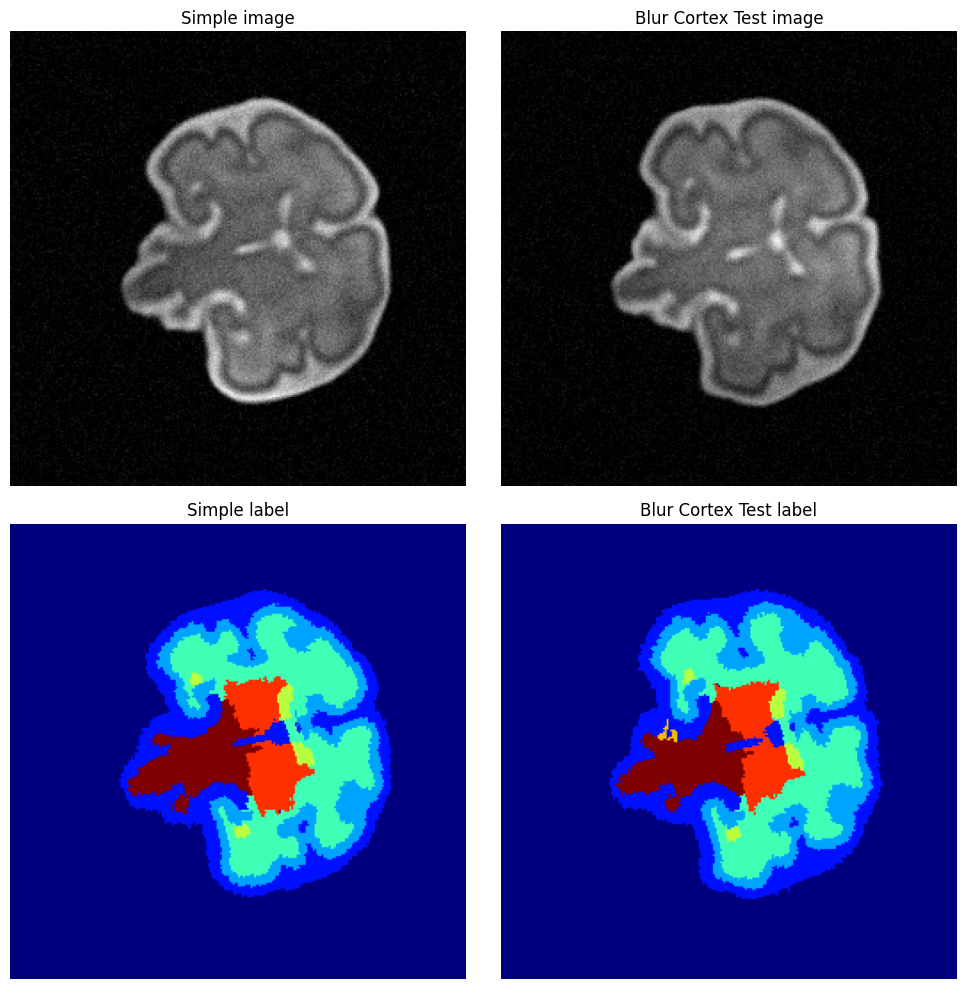

Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Simple image generation time: 0.28866004943847656
Blur Cortex image generation time: 0.3438746929168701


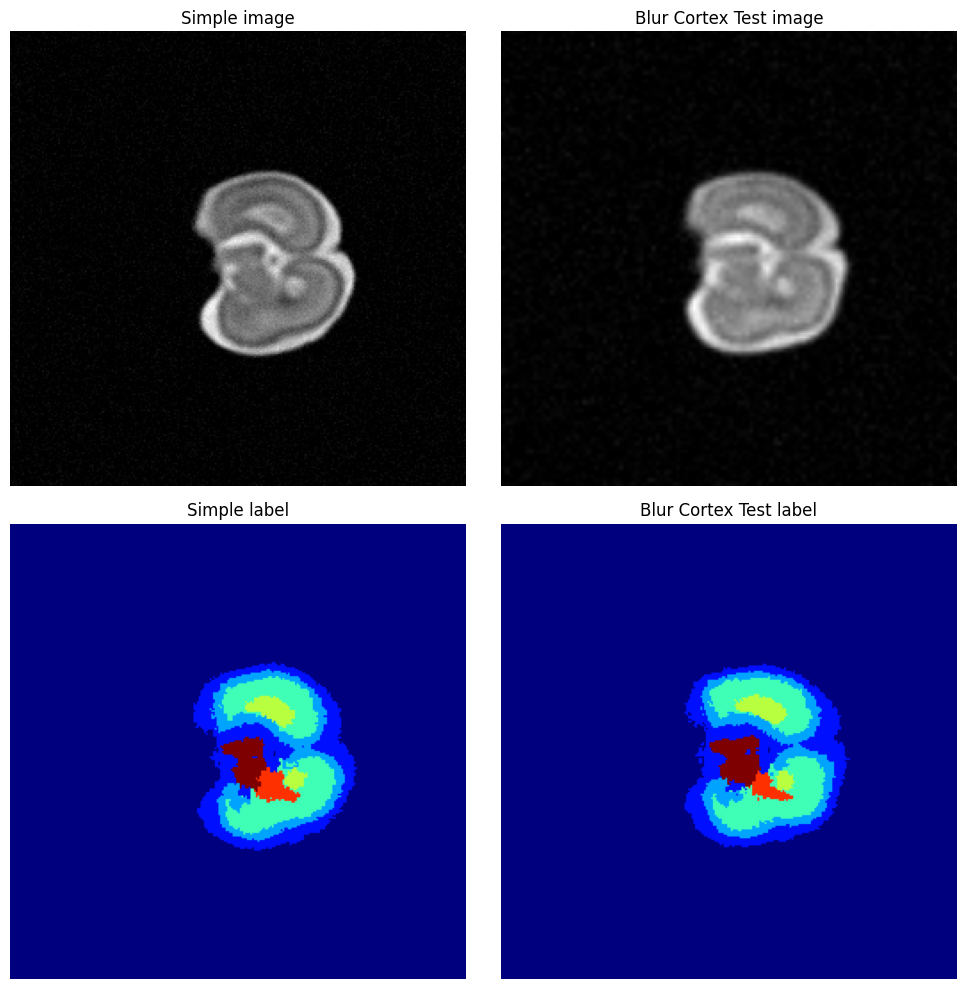

In [4]:
# SR ARTIFACTS CLASSES

# Instantiate BlurCortex
test_name = 'Blur Cortex'
blur_cortex = BlurCortex(
    prob=1,
    cortex_label=2,
    nblur_min=50,
    nblur_max=200,
    sigma_gamma_loc=3,
    sigma_gamma_scale=1,
    std_blur_shape=2,
    std_blur_scale=1,
)

test_gen = FetalSynthGen(
    intensity_generator=None,
    shape=(256, 256, 256),
    resolution=(0.5, 0.5, 0.5),
    device="cuda:0",
    # intensity_generator=intensity_generator,
    spatial_deform=spatial_deform,
    resampler=resampler,
    bias_field=bias_field,
    noise=noise,
    gamma=gamma,
    blur_cortex=blur_cortex,
)

test_dataset = FetalSynthDataset(
    bids_path="./../data",
    generator=test_gen,
    seed_path=None,
    load_image=True,
    image_as_intensity=True,
    sub_list=None,
)


for j in range(3):
    for i in range(3):
        simple_sample = simple_real_ds.sample_with_meta(i)
        test_sample = simple_real_ds.sample_with_meta(
            i, simple_sample["generation_params"]
        )

        plot_sidebyside(simple_sample, test_sample, test_name)

## Struct Noise

Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Simple image generation time: 0.26165223121643066
StructNoise image generation time: 0.42142748832702637


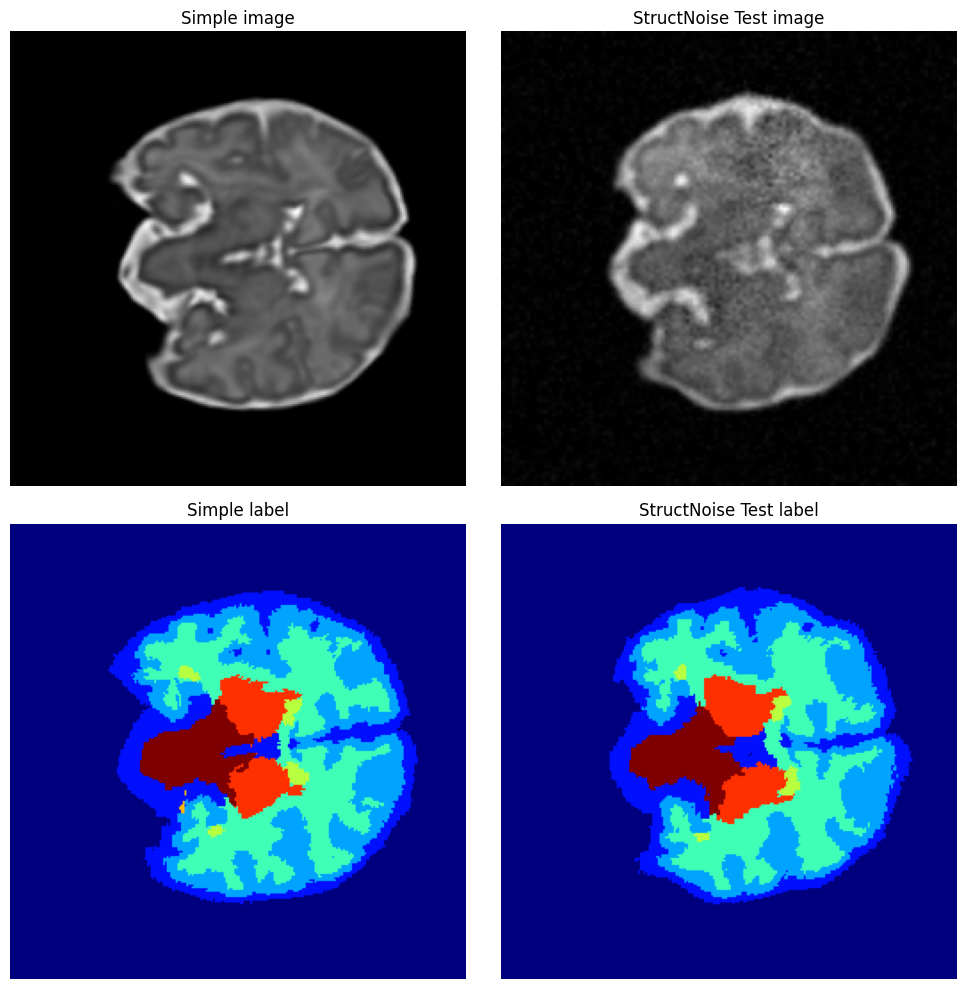

Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Simple image generation time: 0.3582639694213867
StructNoise image generation time: 0.46583104133605957


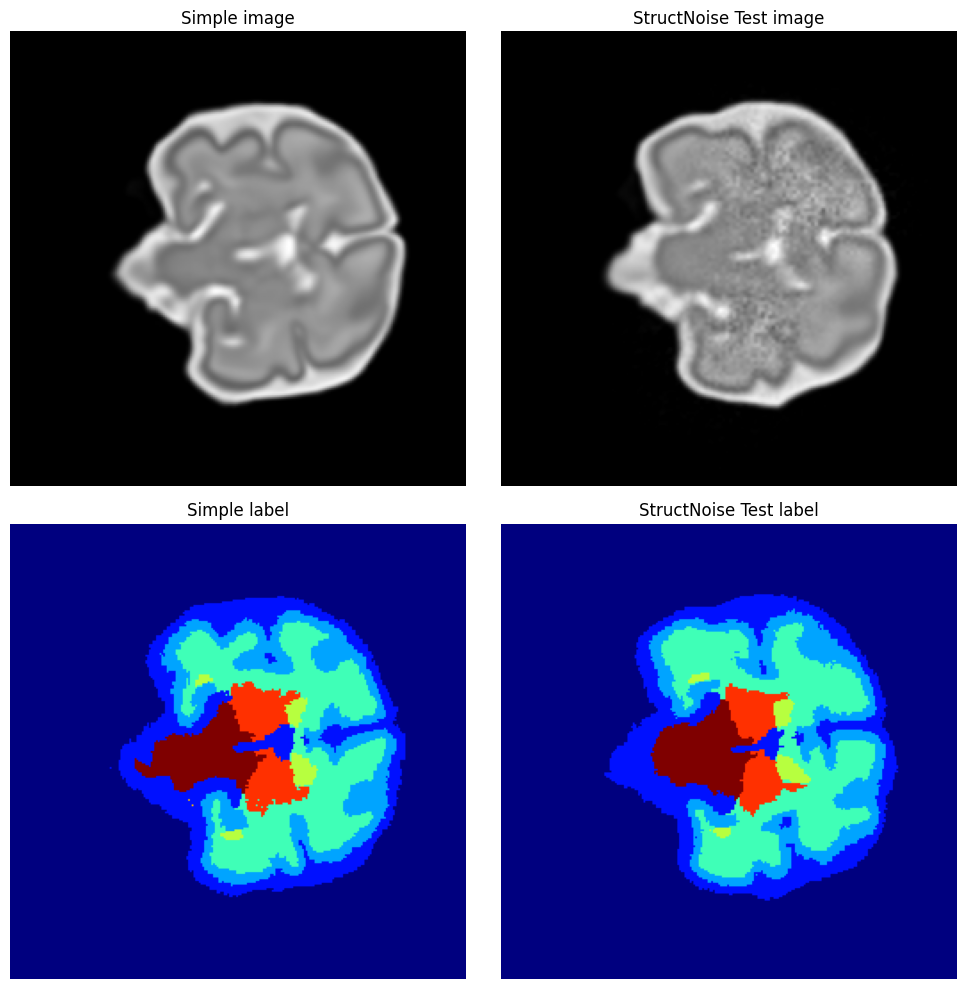

Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Simple image generation time: 0.3209242820739746
StructNoise image generation time: 0.4103875160217285


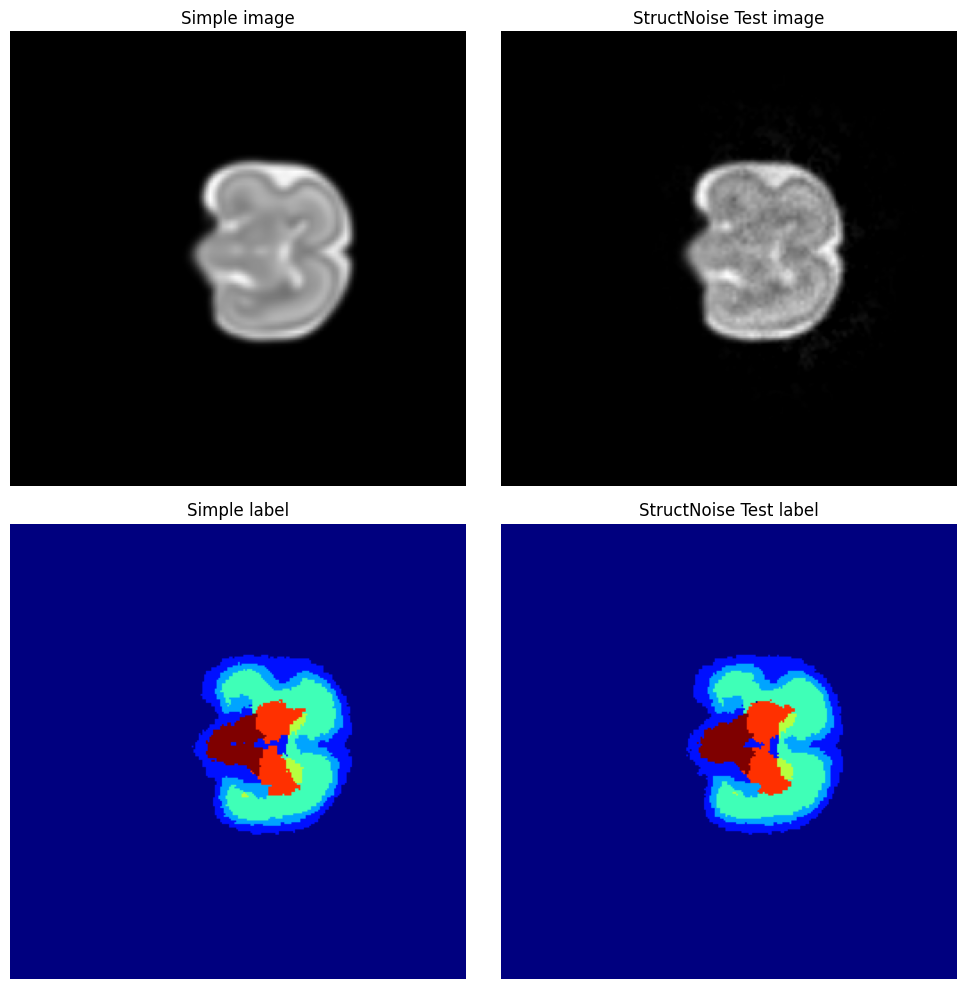

Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Simple image generation time: 0.31305789947509766
StructNoise image generation time: 0.3857841491699219


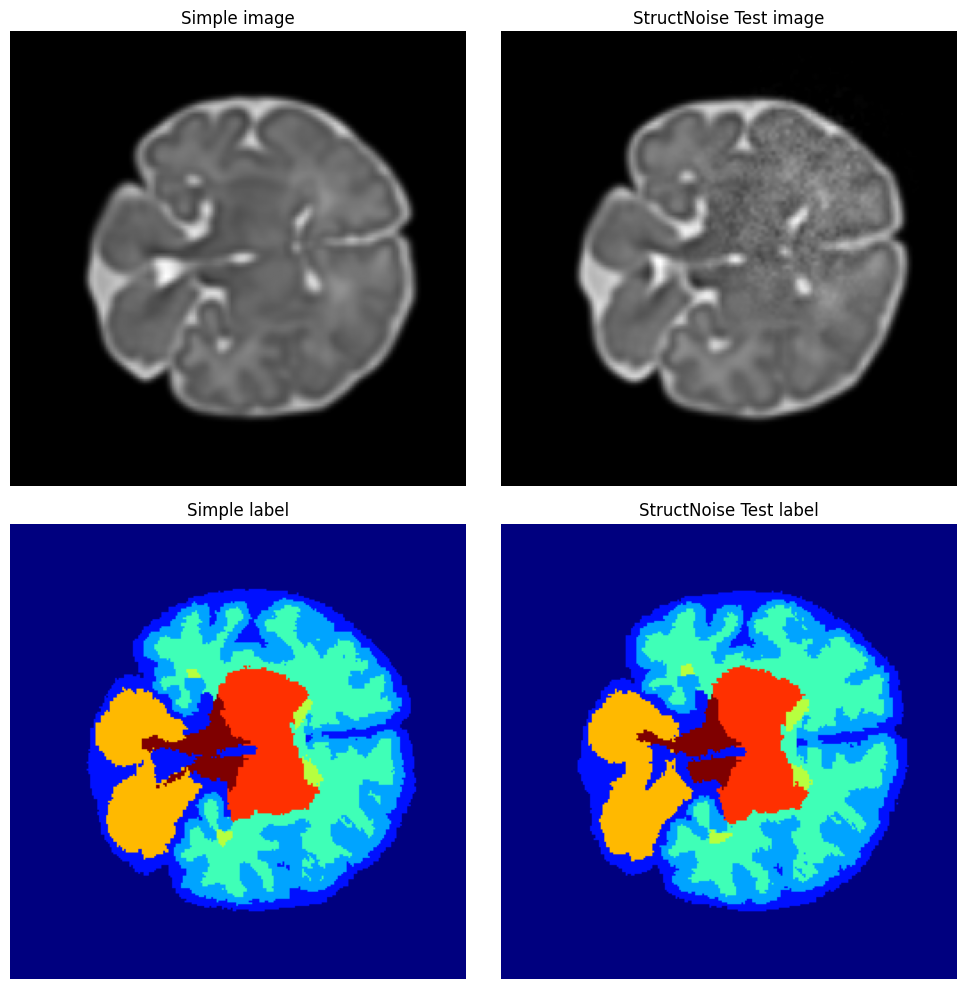

Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Simple image generation time: 0.2612273693084717
StructNoise image generation time: 0.386474609375


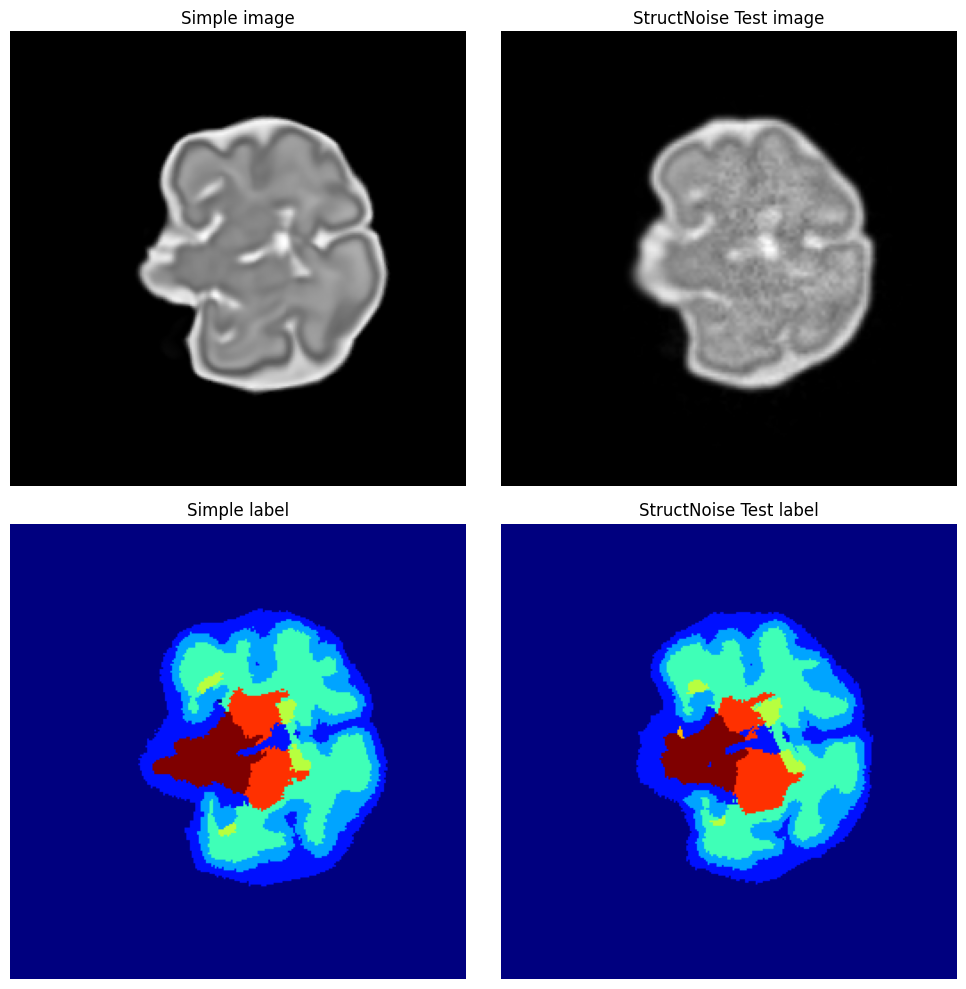

Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Simple image generation time: 0.2610020637512207
StructNoise image generation time: 0.3918569087982178


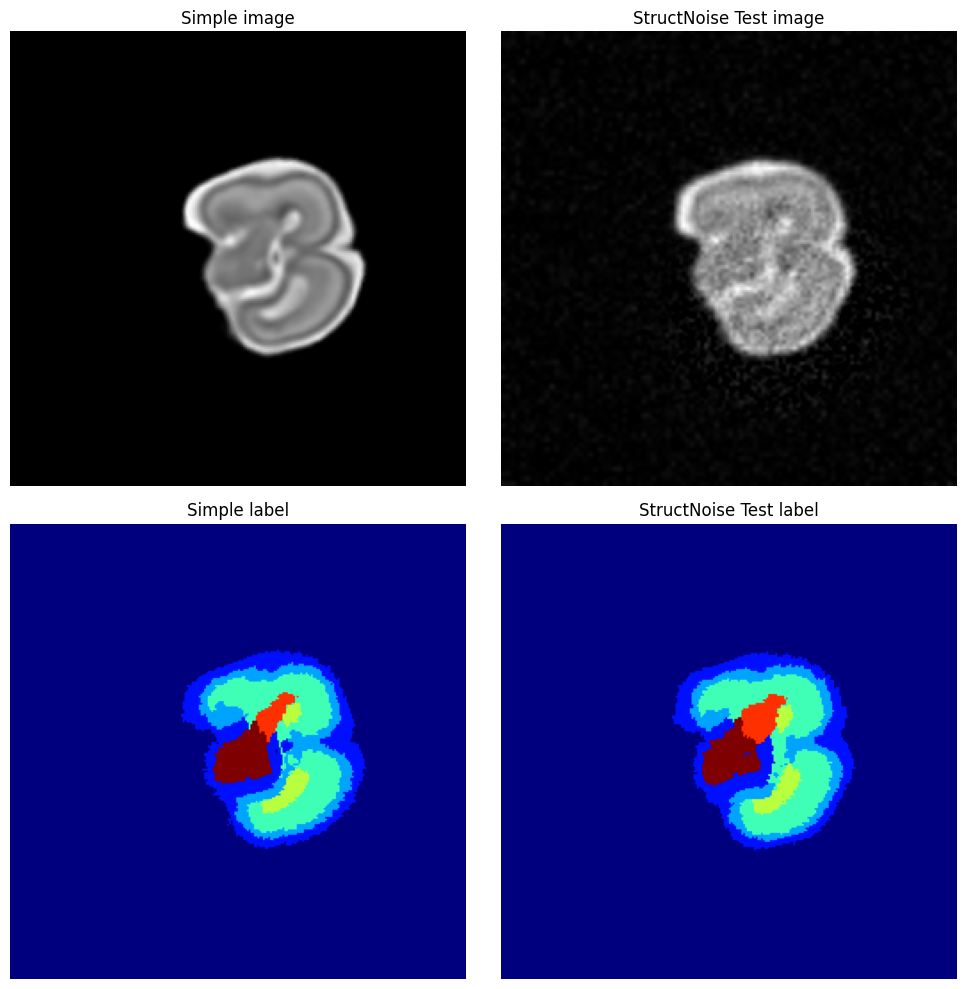

Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Simple image generation time: 0.28844428062438965
StructNoise image generation time: 0.35898351669311523


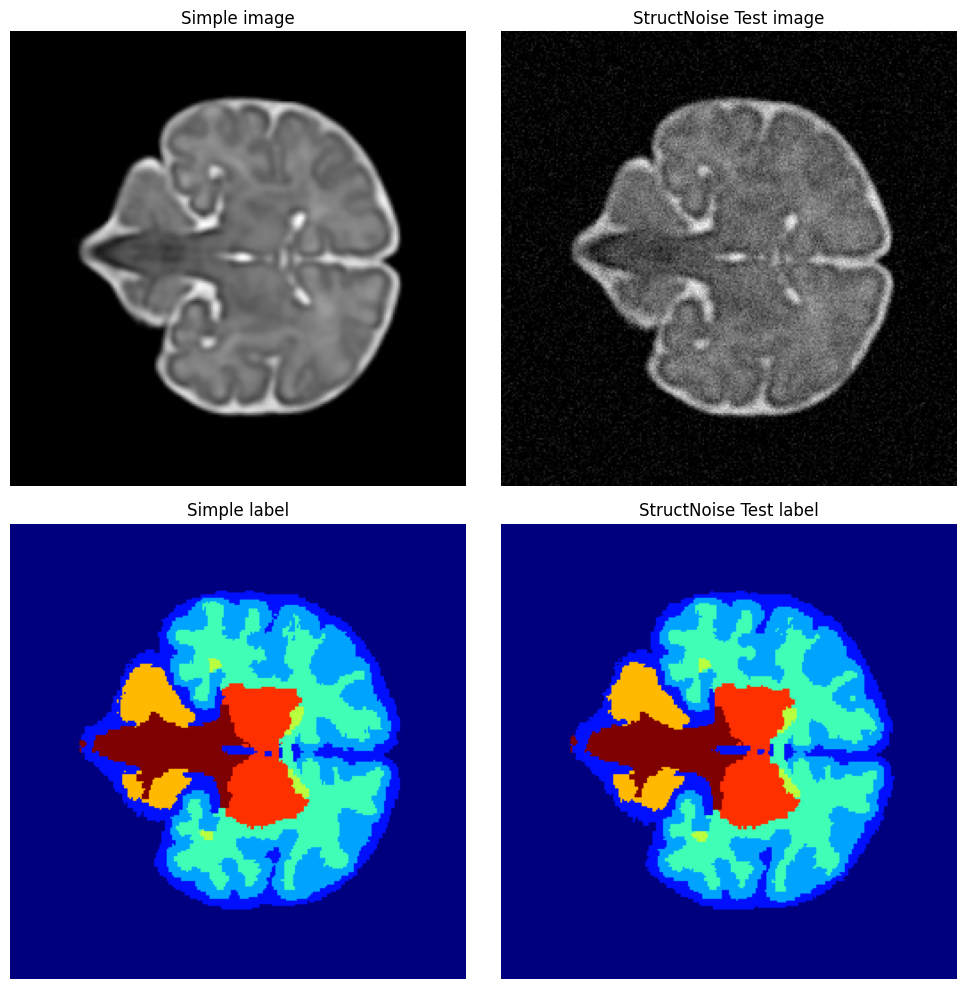

Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Simple image generation time: 0.26225805282592773
StructNoise image generation time: 0.33870506286621094


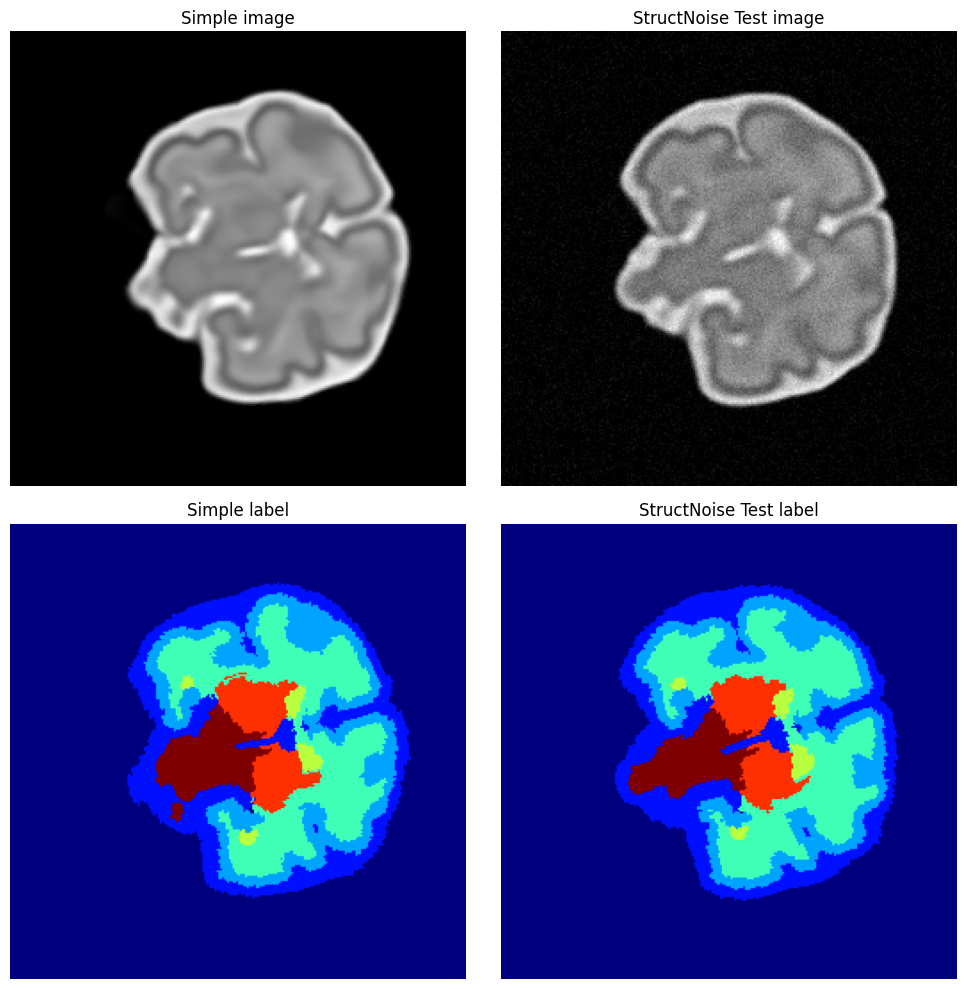

Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Simple image generation time: 0.3521738052368164
StructNoise image generation time: 0.4287571907043457


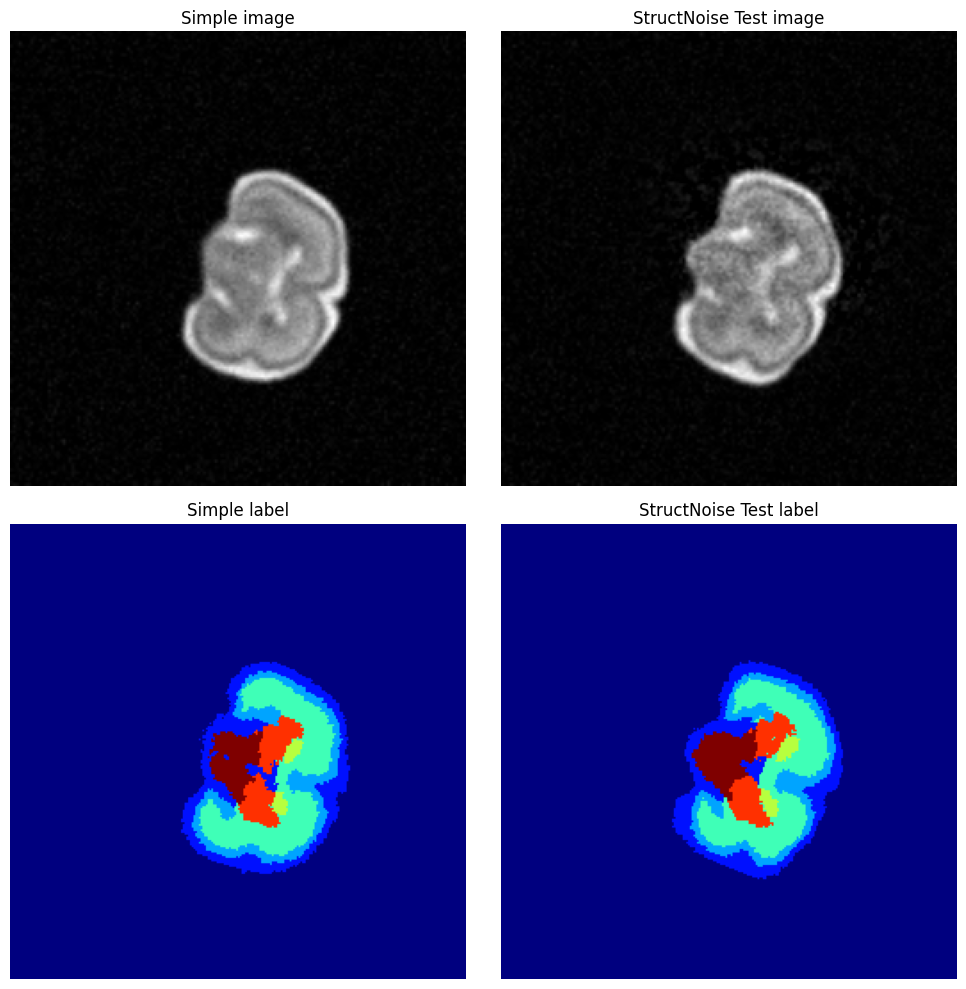

In [5]:
# SR ARTIFACTS CLASSES

# Instantiate BlurCortex
test_name = "StructNoise"
# Instantiate StructNoise
struct_noise = StructNoise(
    prob=1, wm_label=3, std_min=0.2, std_max=0.3, nloc_min=5, nloc_max=10
)

test_gen = FetalSynthGen(
    intensity_generator=None,
    shape=(256, 256, 256),
    resolution=(0.5, 0.5, 0.5),
    device="cuda:0",
    # intensity_generator=intensity_generator,
    spatial_deform=spatial_deform,
    resampler=resampler,
    bias_field=bias_field,
    noise=noise,
    gamma=gamma,
    struct_noise=struct_noise,
)

test_dataset = FetalSynthDataset(
    bids_path="./../data",
    generator=test_gen,
    seed_path=None,
    load_image=True,
    image_as_intensity=True,
    sub_list=None,
)

for j in range(3):
    for i in range(3):
        simple_sample = simple_real_ds.sample_with_meta(i)
        test_sample = test_dataset.sample_with_meta(
            i, simple_sample["generation_params"]
        )

        plot_sidebyside(simple_sample, test_sample, test_name)

## SimBoundared

Output max: 256.9809875488281 min 1.8653945922851562 std 35.32276153564453 mean 175.6827850341797 shape torch.Size([256, 256, 256])
Output max: 247.9285430908203 min 0.0 std 29.242572784423828 mean 140.1573944091797 shape torch.Size([256, 256, 256])
Simple image generation time: 0.2156510353088379
SimulatedBoundaries image generation time: 0.33621788024902344


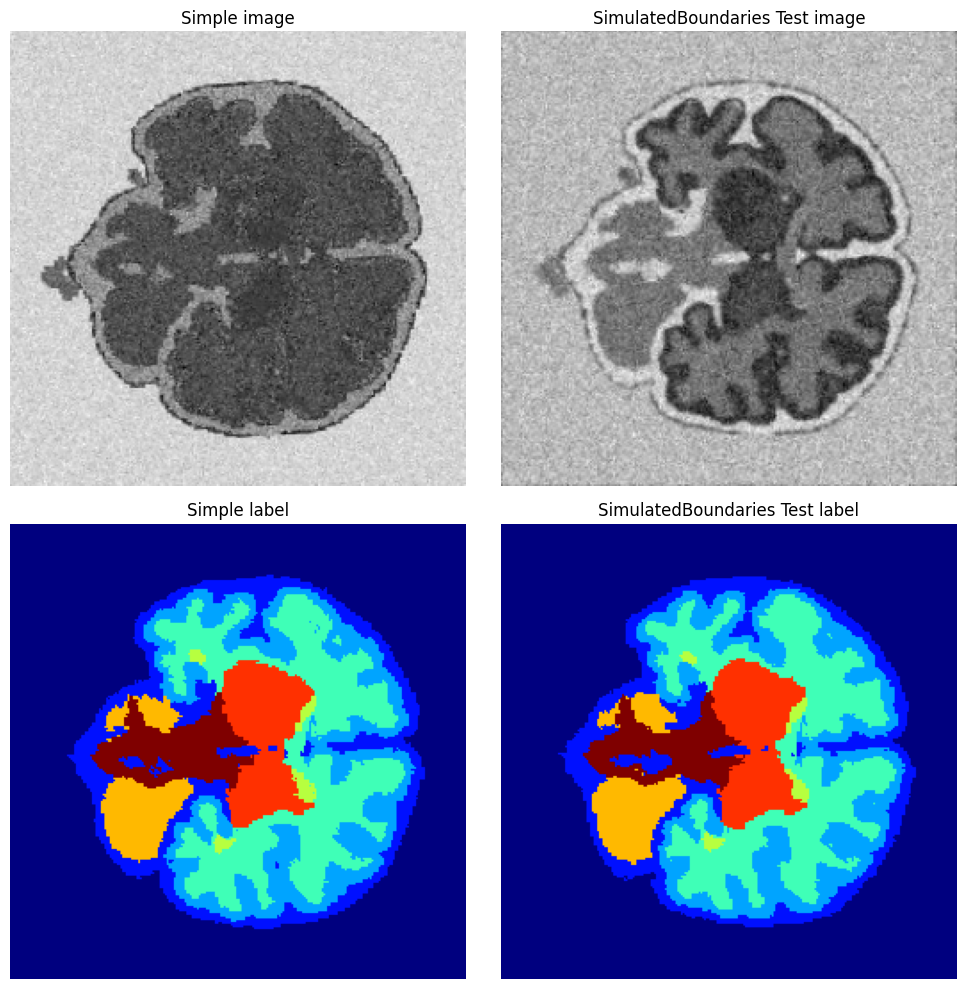

Output max: 308.1087951660156 min 0.0 std 33.19754409790039 mean 120.45561218261719 shape torch.Size([256, 256, 256])
Output max: 294.6732177734375 min 27.19329833984375 std 25.544431686401367 mean 153.14825439453125 shape torch.Size([256, 256, 256])
Simple image generation time: 0.21027064323425293
SimulatedBoundaries image generation time: 0.28331565856933594


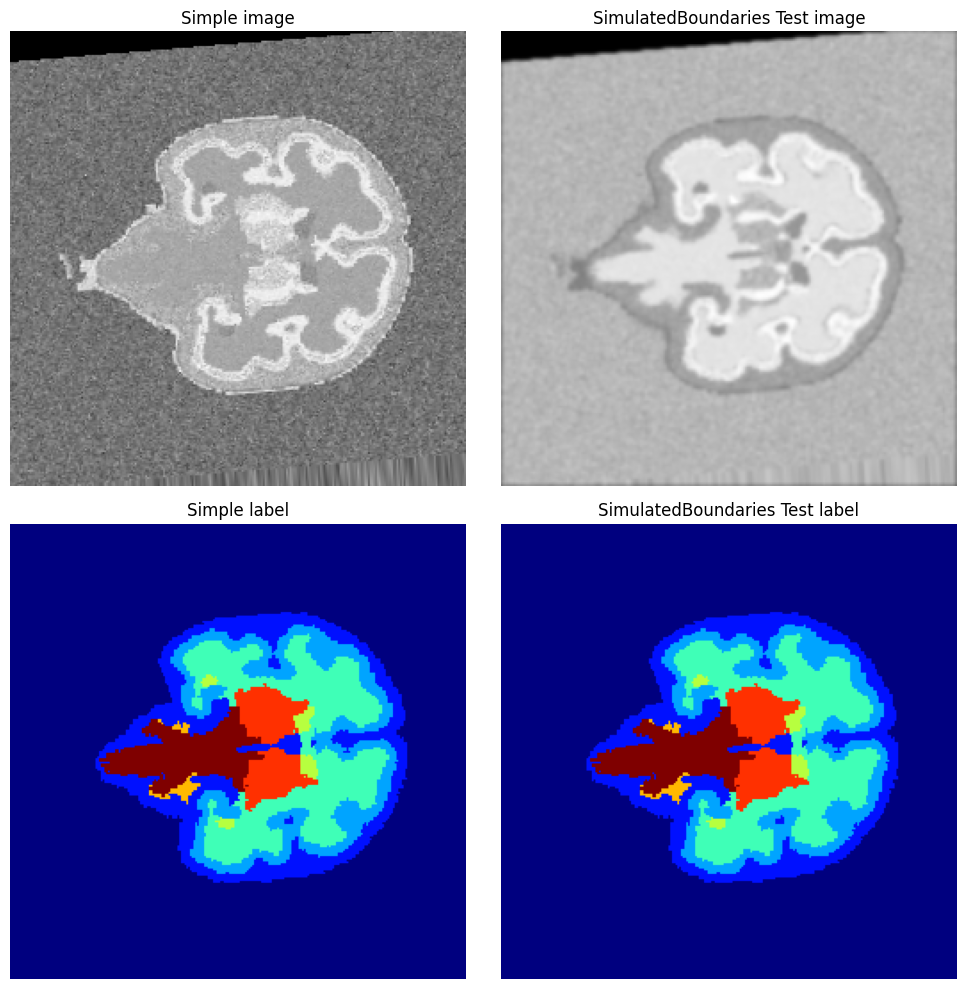

Output max: 320.6432189941406 min 21.602340698242188 std 12.916190147399902 mean 207.99325561523438 shape torch.Size([256, 256, 256])
Output max: 315.60888671875 min 73.02037048339844 std 12.17189884185791 mean 223.6656494140625 shape torch.Size([256, 256, 256])
Simple image generation time: 0.2293393611907959
SimulatedBoundaries image generation time: 14.577549457550049


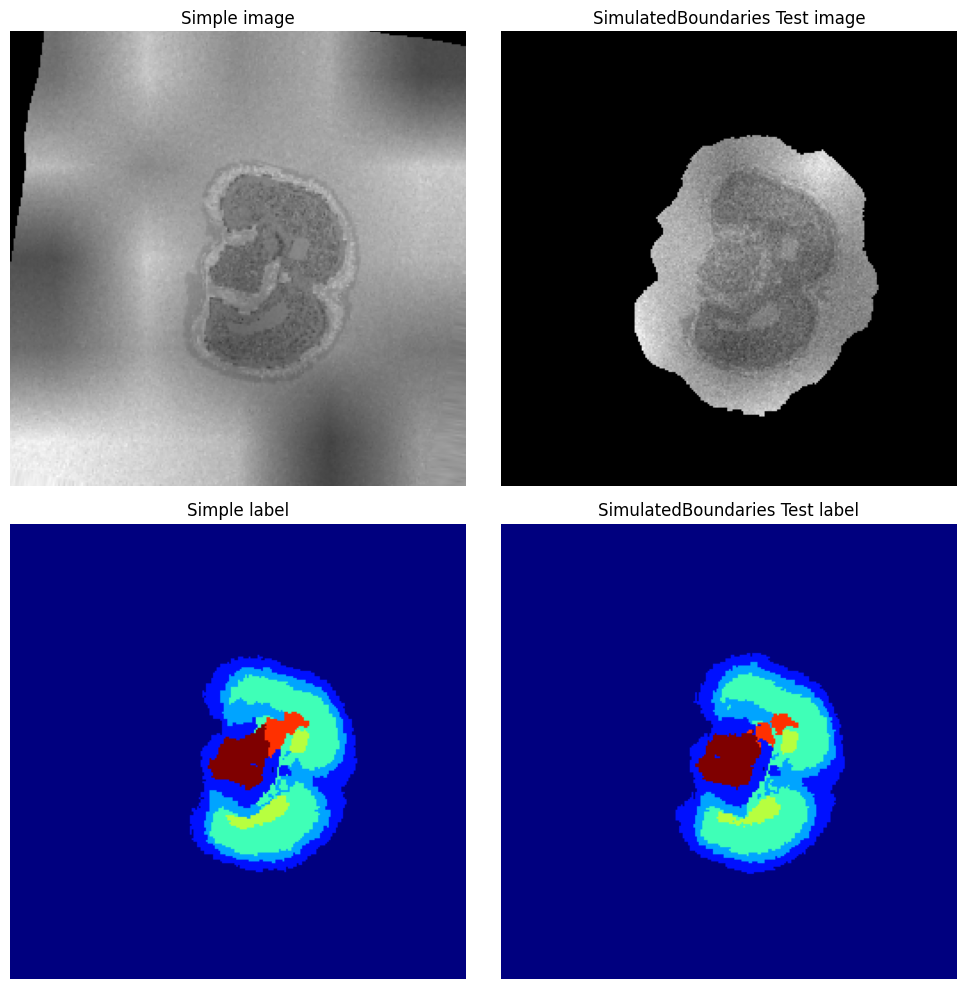

Output max: 294.7969970703125 min 0.0 std 33.21422576904297 mean 155.3326416015625 shape torch.Size([256, 256, 256])
Output max: 294.12713623046875 min 0.0 std 32.840057373046875 mean 145.51174926757812 shape torch.Size([256, 256, 256])
Simple image generation time: 0.21662139892578125
SimulatedBoundaries image generation time: 0.2452831268310547


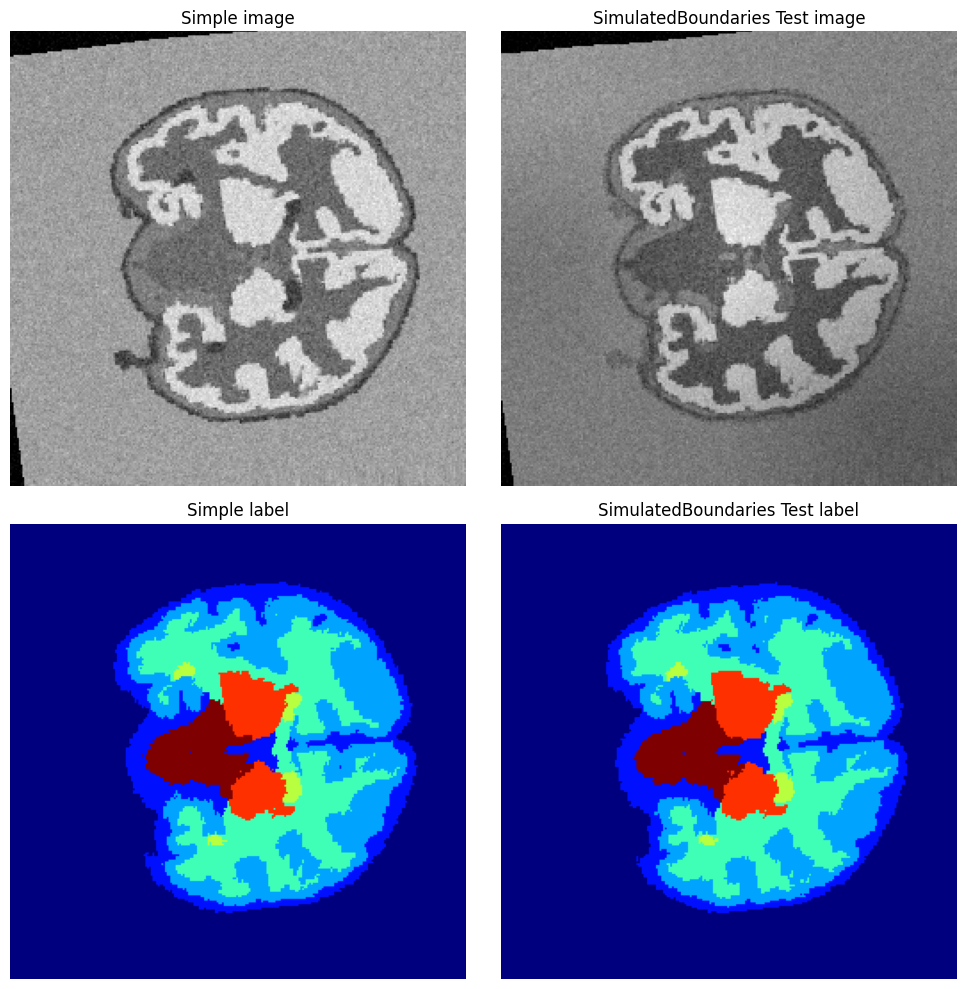

Output max: 301.90350341796875 min 0.0 std 23.561758041381836 mean 147.63656616210938 shape torch.Size([256, 256, 256])
Output max: 279.4787902832031 min 0.0 std 29.335163116455078 mean 160.56536865234375 shape torch.Size([256, 256, 256])
Simple image generation time: 0.2122964859008789
SimulatedBoundaries image generation time: 0.21505498886108398


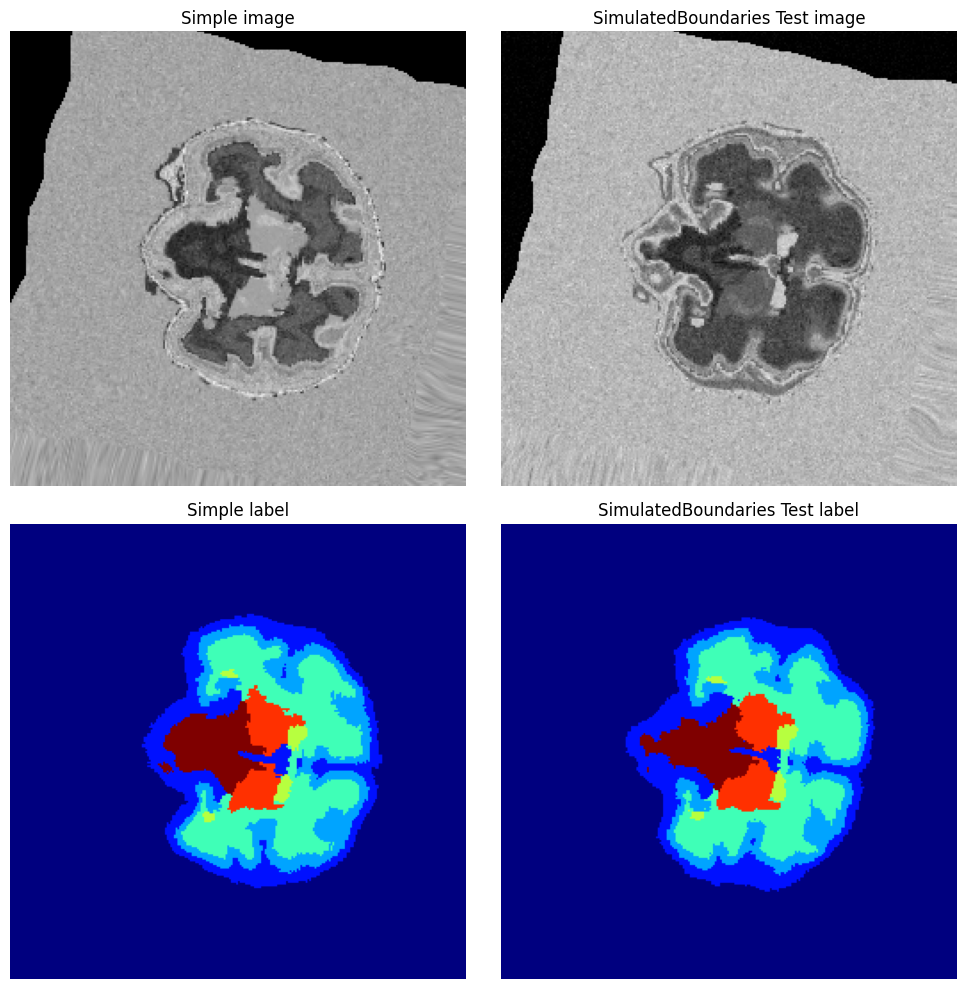

Output max: 324.55718994140625 min 0.0 std 24.738143920898438 mean 168.9805908203125 shape torch.Size([256, 256, 256])
Output max: 319.11285400390625 min 0.0 std 22.311262130737305 mean 146.96133422851562 shape torch.Size([256, 256, 256])
Simple image generation time: 0.24174761772155762
SimulatedBoundaries image generation time: 0.23624062538146973


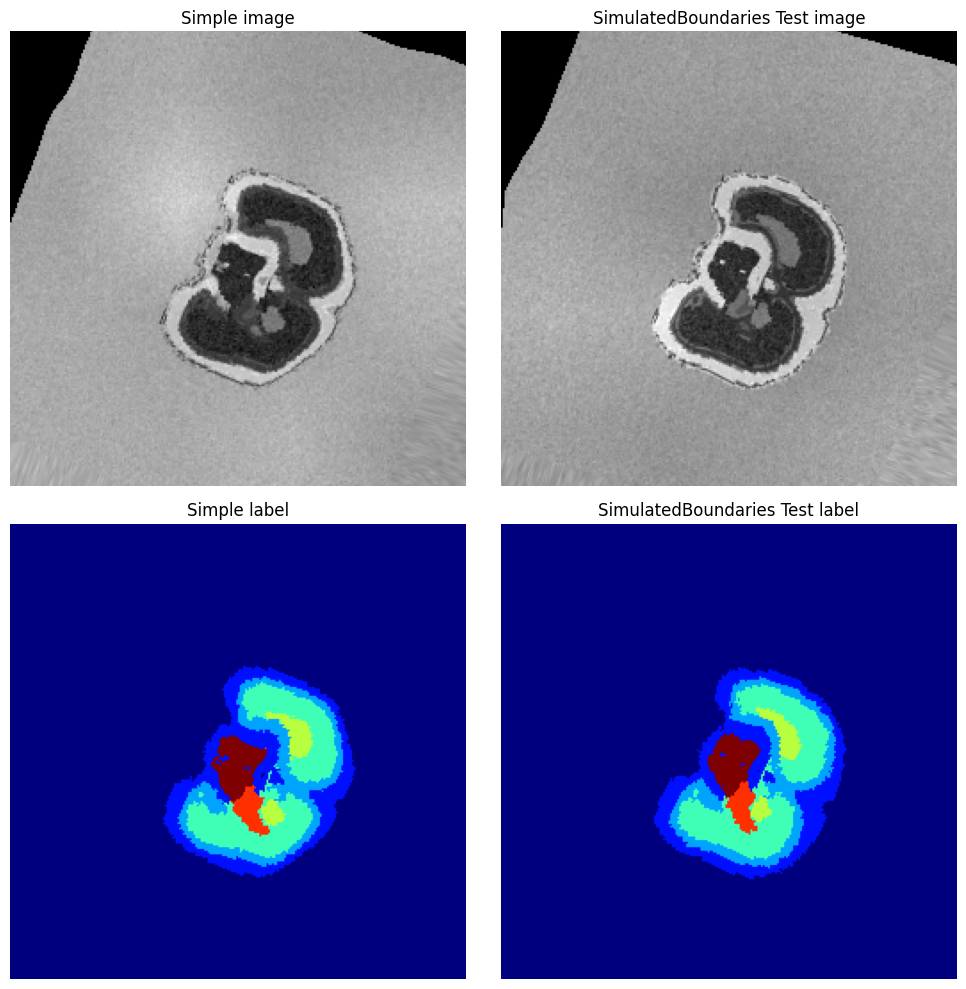

Output max: 302.2816162109375 min 0.0 std 38.03461837768555 mean 138.24826049804688 shape torch.Size([256, 256, 256])
Output max: 302.443115234375 min 0.0 std 40.61488723754883 mean 137.67916870117188 shape torch.Size([256, 256, 256])
Simple image generation time: 0.21994471549987793
SimulatedBoundaries image generation time: 0.33120226860046387


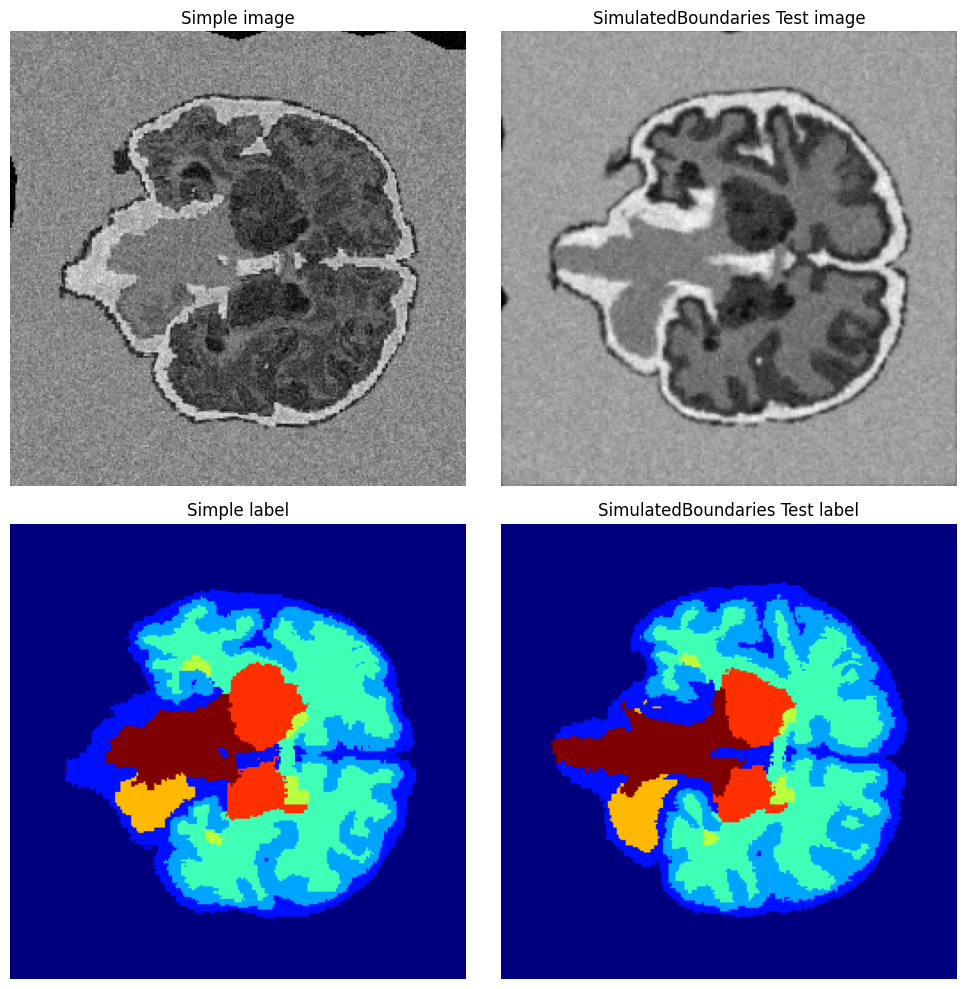

Output max: 295.42315673828125 min 39.55042266845703 std 16.79730987548828 mean 161.2467803955078 shape torch.Size([256, 256, 256])
Output max: 292.57806396484375 min 72.03429412841797 std 15.784056663513184 mean 146.33116149902344 shape torch.Size([256, 256, 256])
Simple image generation time: 0.2517740726470947
SimulatedBoundaries image generation time: 2.434138059616089


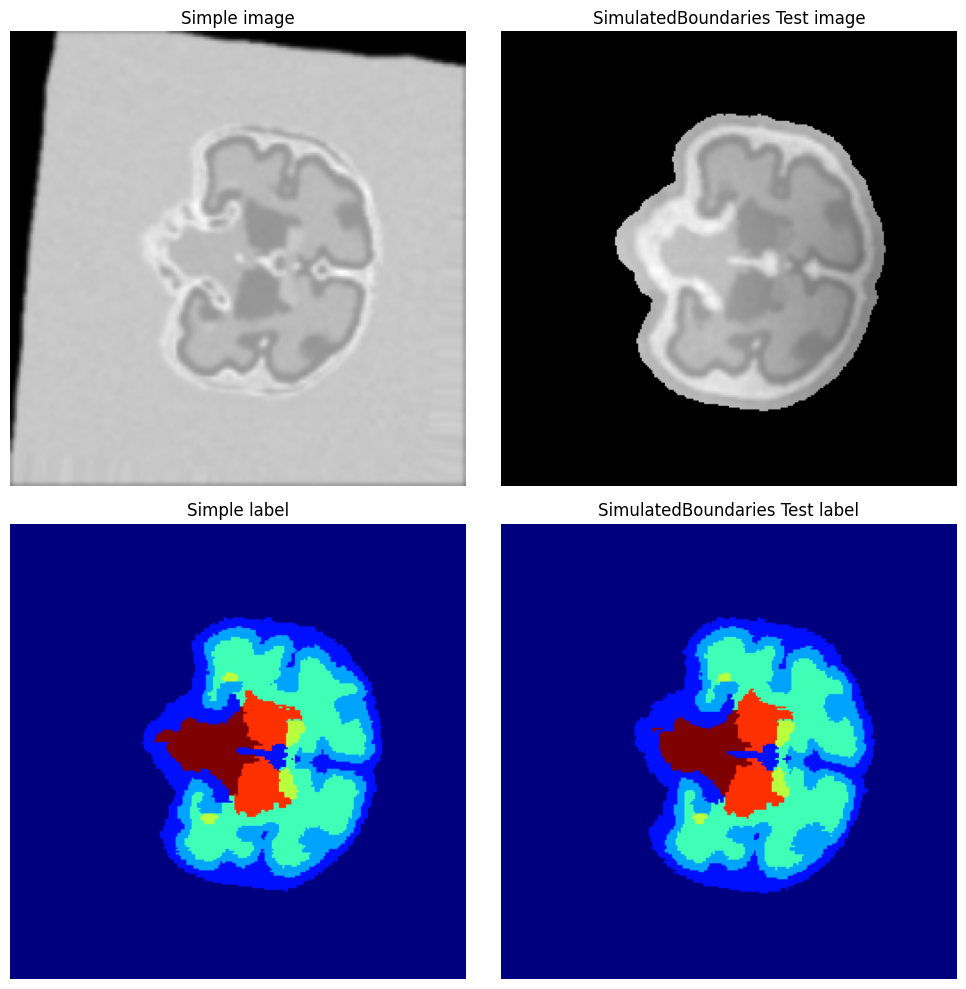

Output max: 284.84613037109375 min 0.0 std 23.197202682495117 mean 121.30570220947266 shape torch.Size([256, 256, 256])
Output max: 271.1567077636719 min 0.0 std 23.135616302490234 mean 104.70683288574219 shape torch.Size([256, 256, 256])
Simple image generation time: 0.2875826358795166
SimulatedBoundaries image generation time: 0.2888026237487793


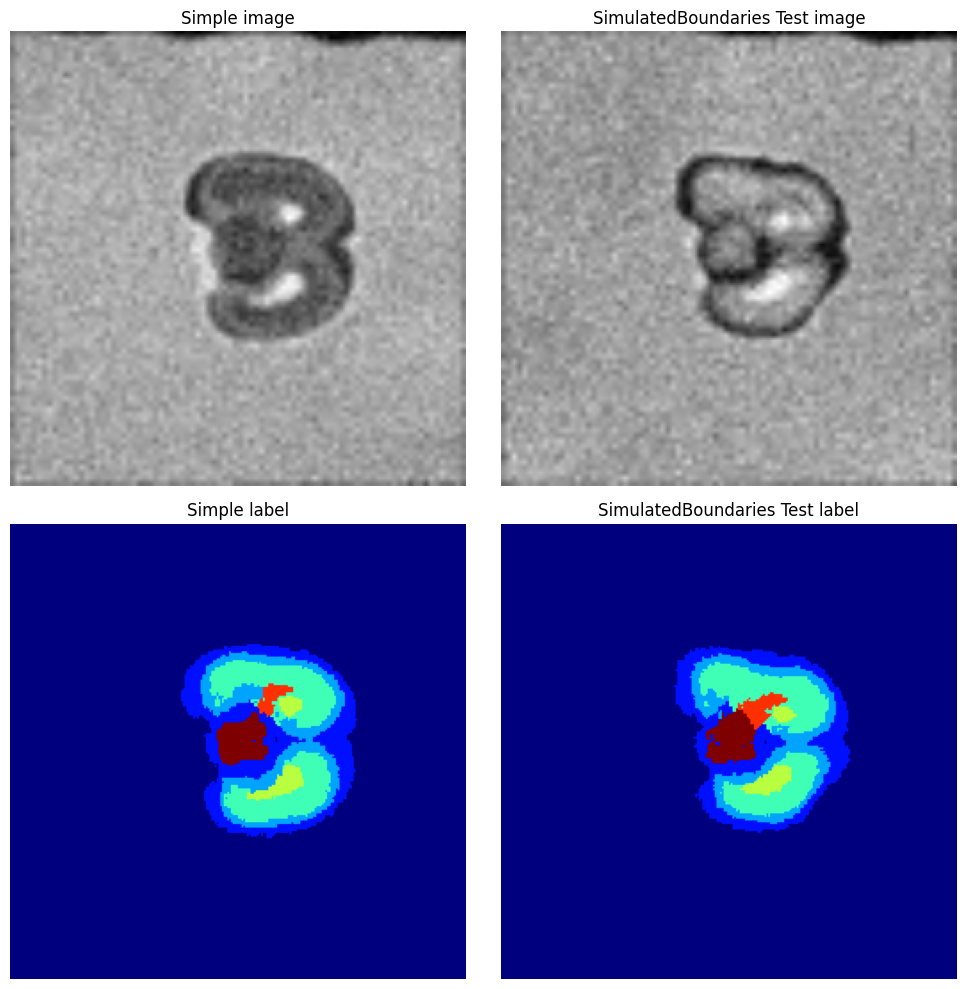

In [6]:
# SR ARTIFACTS CLASSES

# Instantiate BlurCortex
test_name = "SimulatedBoundaries"
# Instantiate SimulatedBoundaries
boundaries = SimulatedBoundaries(
    prob_no_mask=0.5, prob_if_mask_halo=0.5, prob_if_mask_fuzzy=0.5
)
test_gen = FetalSynthGen(
    shape=(256, 256, 256),
    resolution=(0.5, 0.5, 0.5),
    device="cuda:0",
    intensity_generator=intensity_generator,
    spatial_deform=spatial_deform,
    resampler=resampler,
    bias_field=bias_field,
    noise=noise,
    gamma=gamma,
    boundaries=boundaries,
)

test_dataset = FetalSynthDataset(
    bids_path="./../data",
    generator=test_gen,
    seed_path='./../data/derivatives/seeds',
    load_image=False,
    image_as_intensity=False,
    sub_list=None,
)

for j in range(3):
    for i in range(3):
        simple_sample = simple_synth_ds.sample_with_meta(i)
        test_sample = test_dataset.sample_with_meta(
            i, simple_sample["generation_params"]
        )

        plot_sidebyside(simple_sample, test_sample, test_name)

## SimulateMotion

Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
{'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.5506045936487605, 'slice_thickness': 1.5283376650167695, 'gap': 1.7972494059672905, 'nstacks': 3, 'smooth_volume_on': False, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [True, False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 3}}
Simple image generation time: 0.26174211502075195
SimulateMotion image generation time: 0.956190824508667


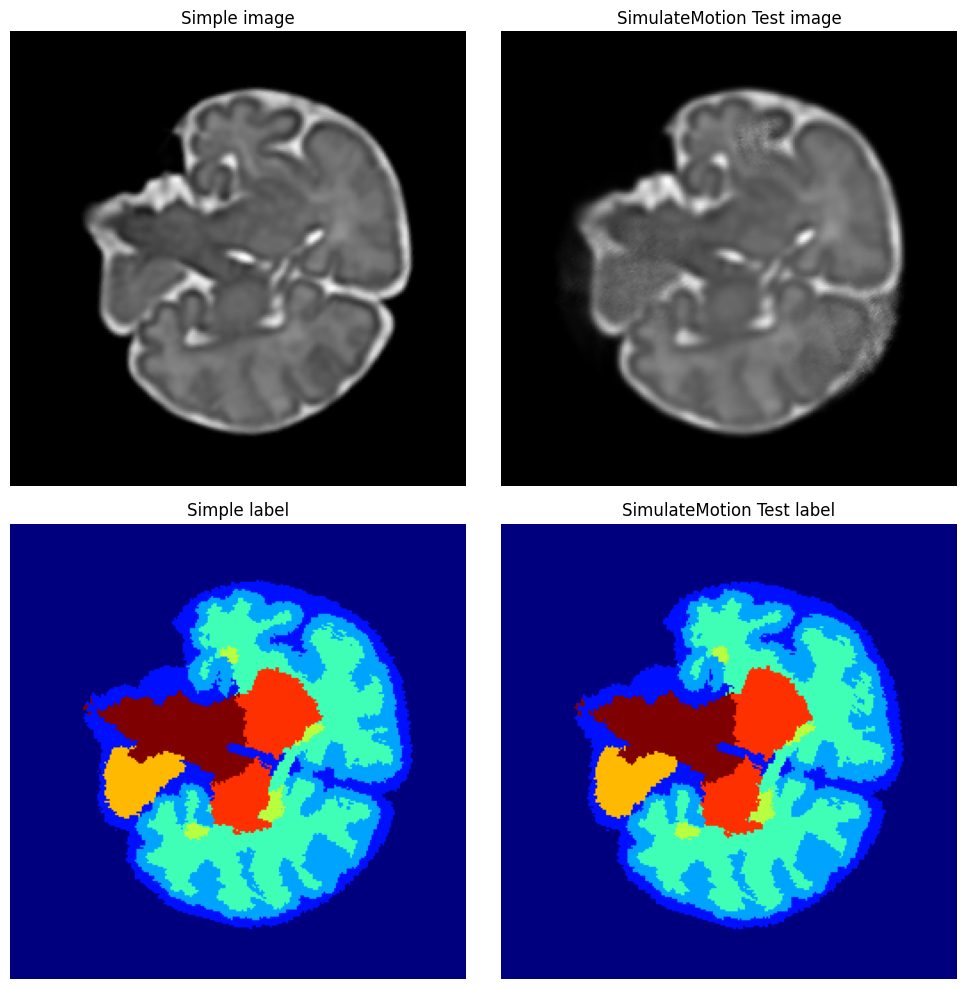

Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
{'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.5457538305620708, 'slice_thickness': 4.129694109227233, 'gap': 2.407054676105434, 'nstacks': 4, 'smooth_volume_on': False, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [False, False, False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 2}}
Simple image generation time: 0.395174503326416
SimulateMotion image generation time: 1.2619678974151611


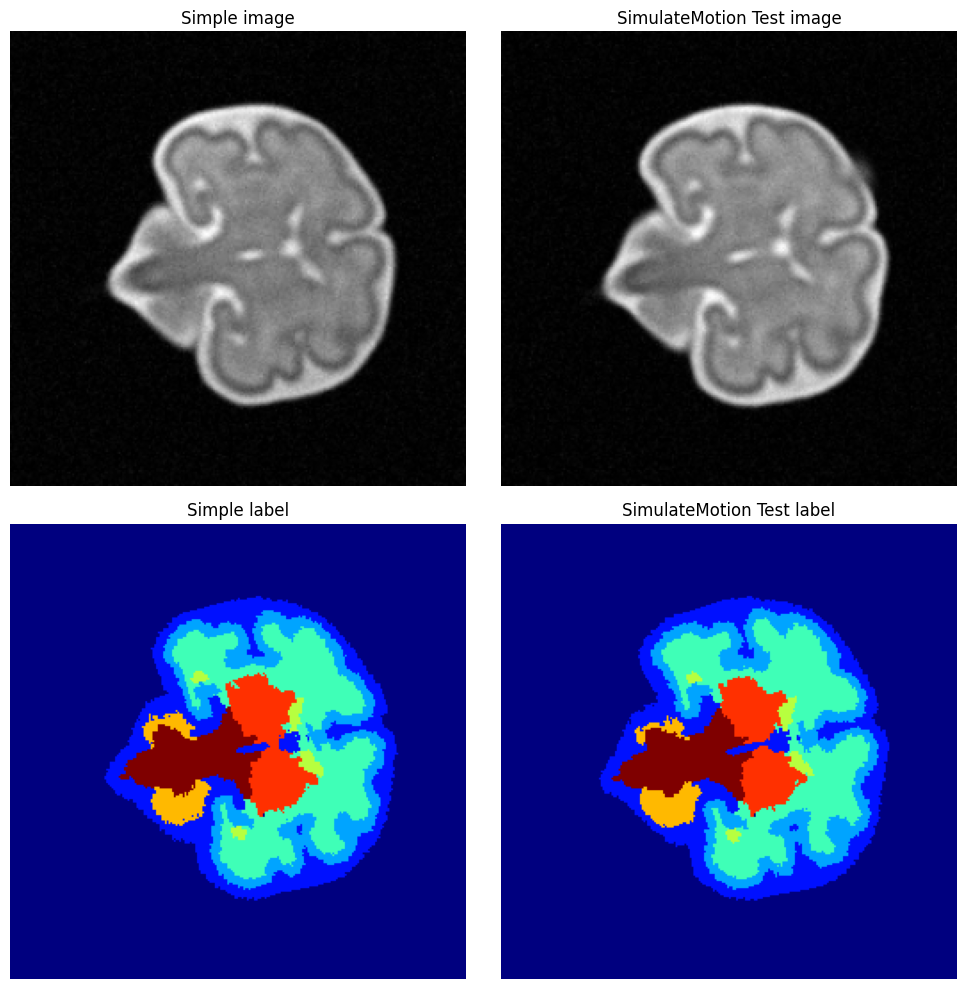

Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
{'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.8812256118225403, 'slice_thickness': 3.6157677413192957, 'gap': 3.092296814983671, 'nstacks': 6, 'smooth_volume_on': False, 'rm_slices_on': True, 'rm_slices_ratio': 0.19405459294907149, 'misreg_stack_on': [False, False, False, False, False, False], 'misreg_slice_on': False, 'merge_volume_on': False, 'ngaussians_merge': 2}}
Simple image generation time: 0.2868638038635254
SimulateMotion image generation time: 1.7319989204406738


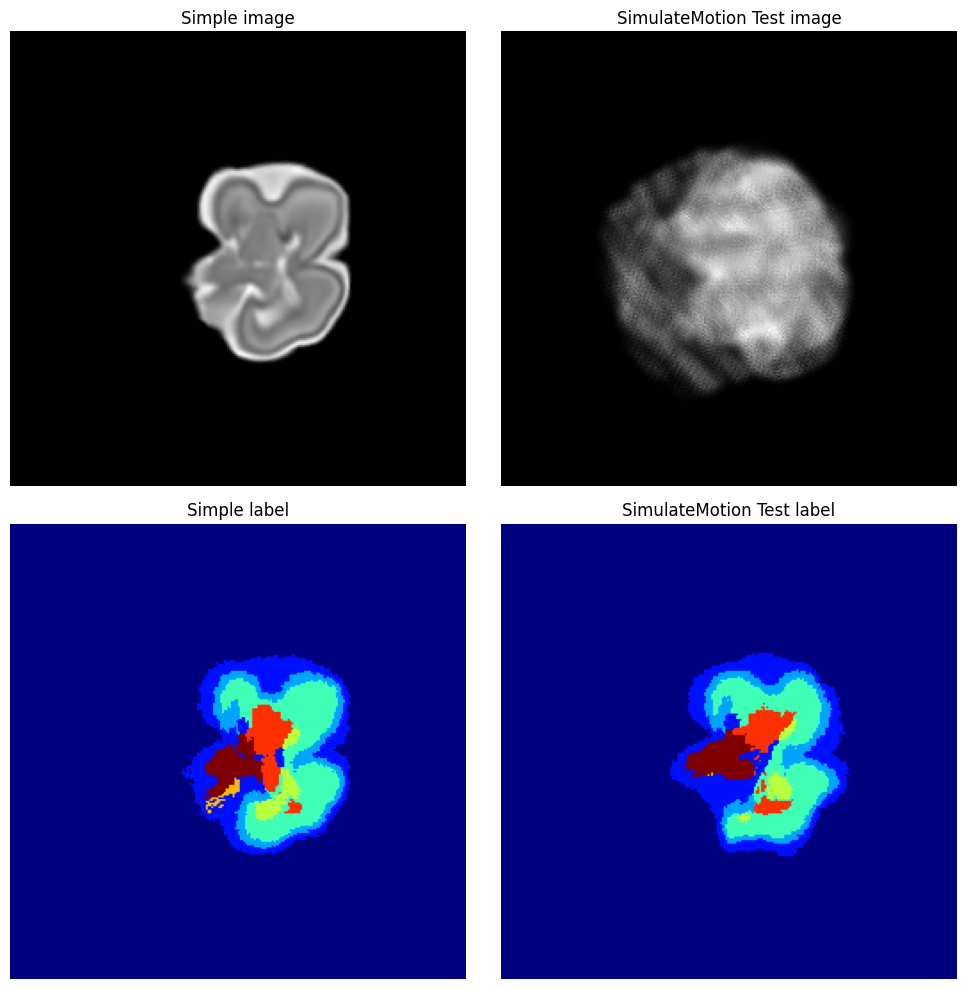

Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
{'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.4186960670306254, 'slice_thickness': 3.032805597611693, 'gap': 2.587783751188481, 'nstacks': 4, 'smooth_volume_on': False, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [False, False, False, False], 'misreg_slice_on': True, 'merge_volume_on': True, 'ngaussians_merge': 2}}
Simple image generation time: 0.29328131675720215
SimulateMotion image generation time: 0.732703447341919


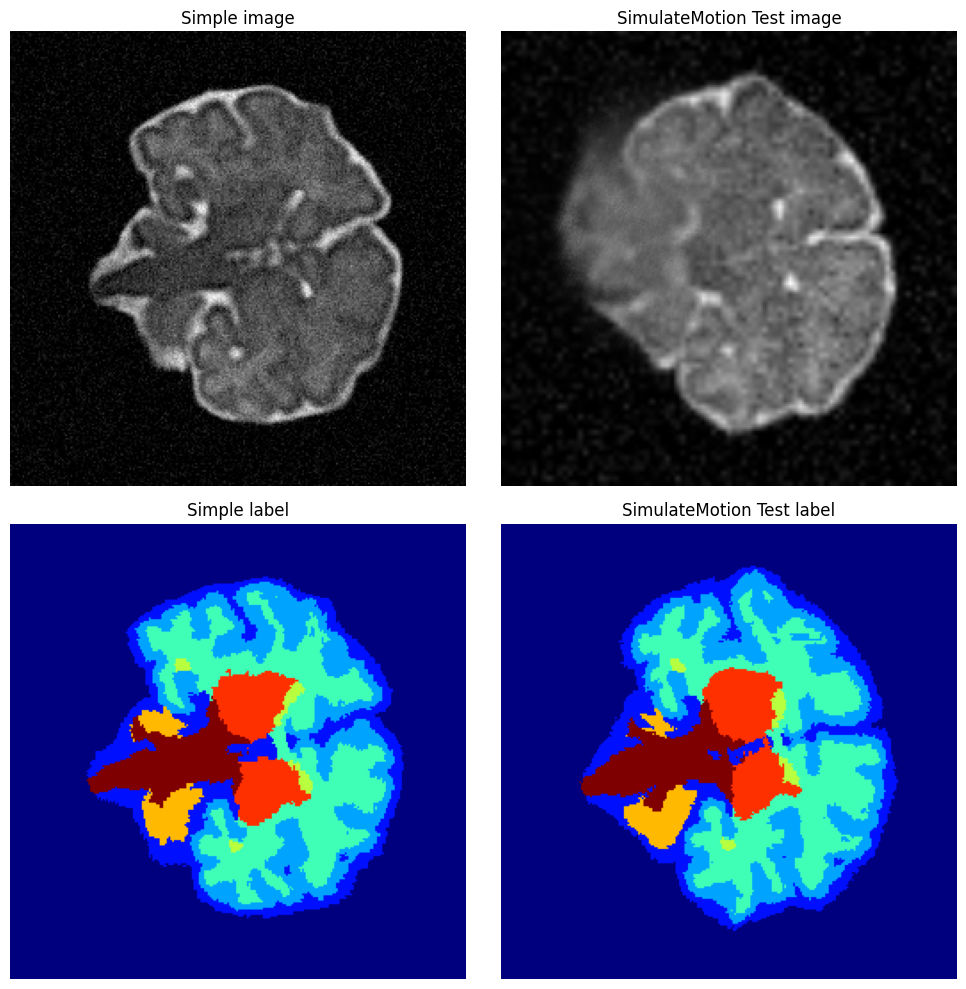

Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
{'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.7133214993509635, 'slice_thickness': 4.821697632482232, 'gap': 3.1218365410978417, 'nstacks': 2, 'smooth_volume_on': False, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 3}}
Simple image generation time: 0.2957291603088379
SimulateMotion image generation time: 1.3638708591461182


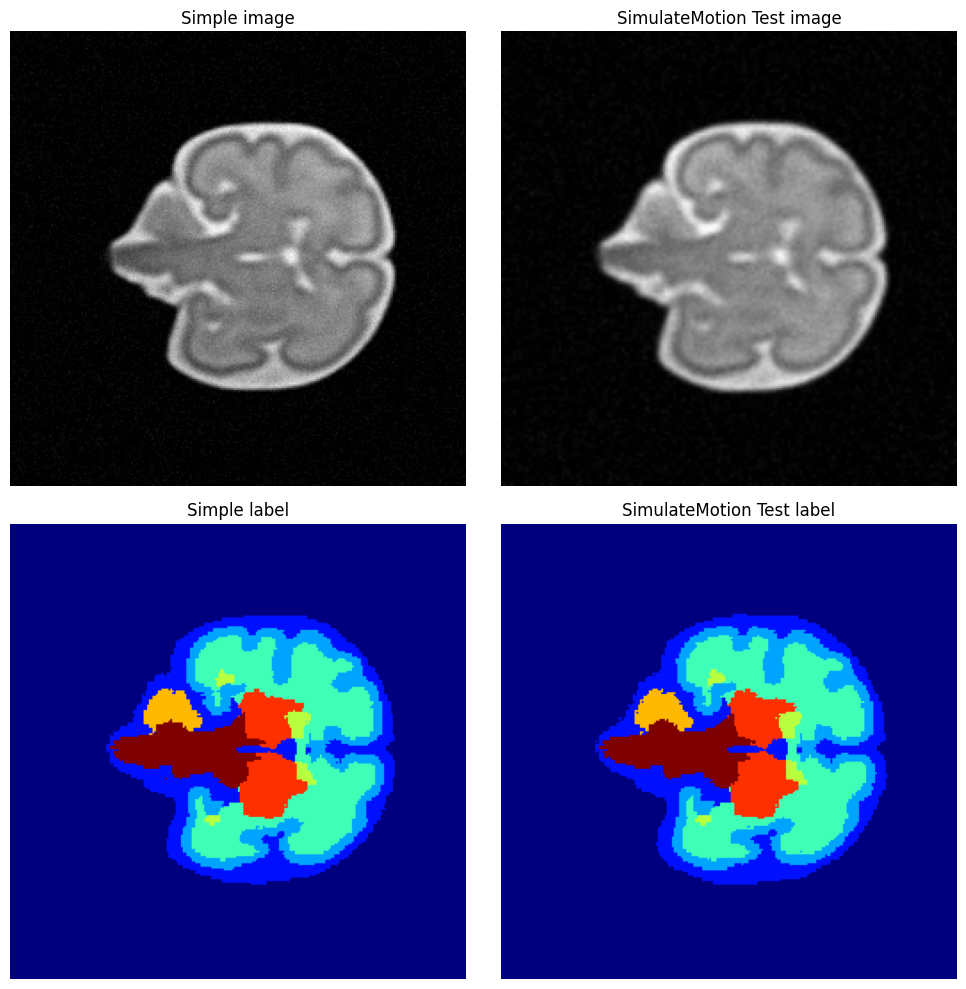

Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
{'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.43019232359440396, 'slice_thickness': 2.7497095213100593, 'gap': 1.8125920434699547, 'nstacks': 3, 'smooth_volume_on': False, 'rm_slices_on': True, 'rm_slices_ratio': 0.12338663265316206, 'misreg_stack_on': [False, False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 3}}
Simple image generation time: 0.3582186698913574
SimulateMotion image generation time: 0.7283105850219727


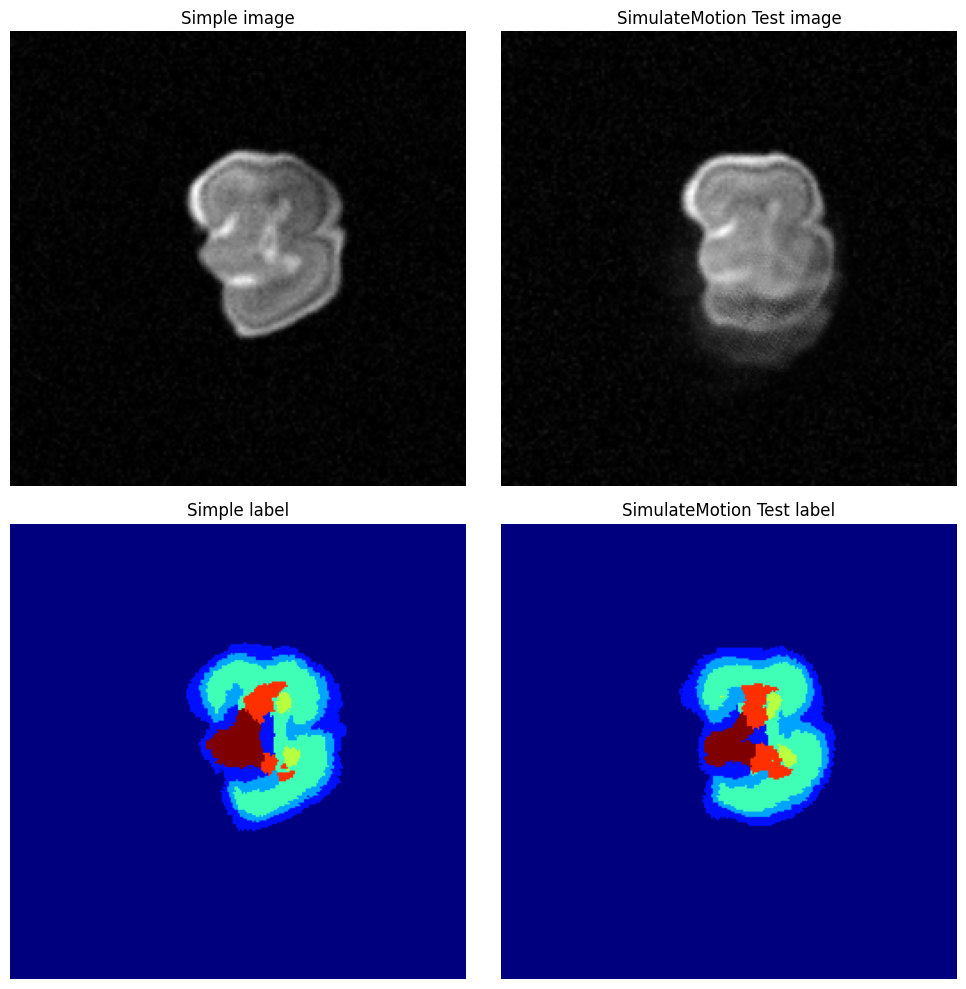

Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 45.93324279785156 mean 22.79496192932129 shape torch.Size([256, 256, 256])
{'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.6405325124692012, 'slice_thickness': 4.276430197771013, 'gap': 1.6726430783608428, 'nstacks': 2, 'smooth_volume_on': False, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 2}}
Simple image generation time: 0.36219310760498047
SimulateMotion image generation time: 1.1574032306671143


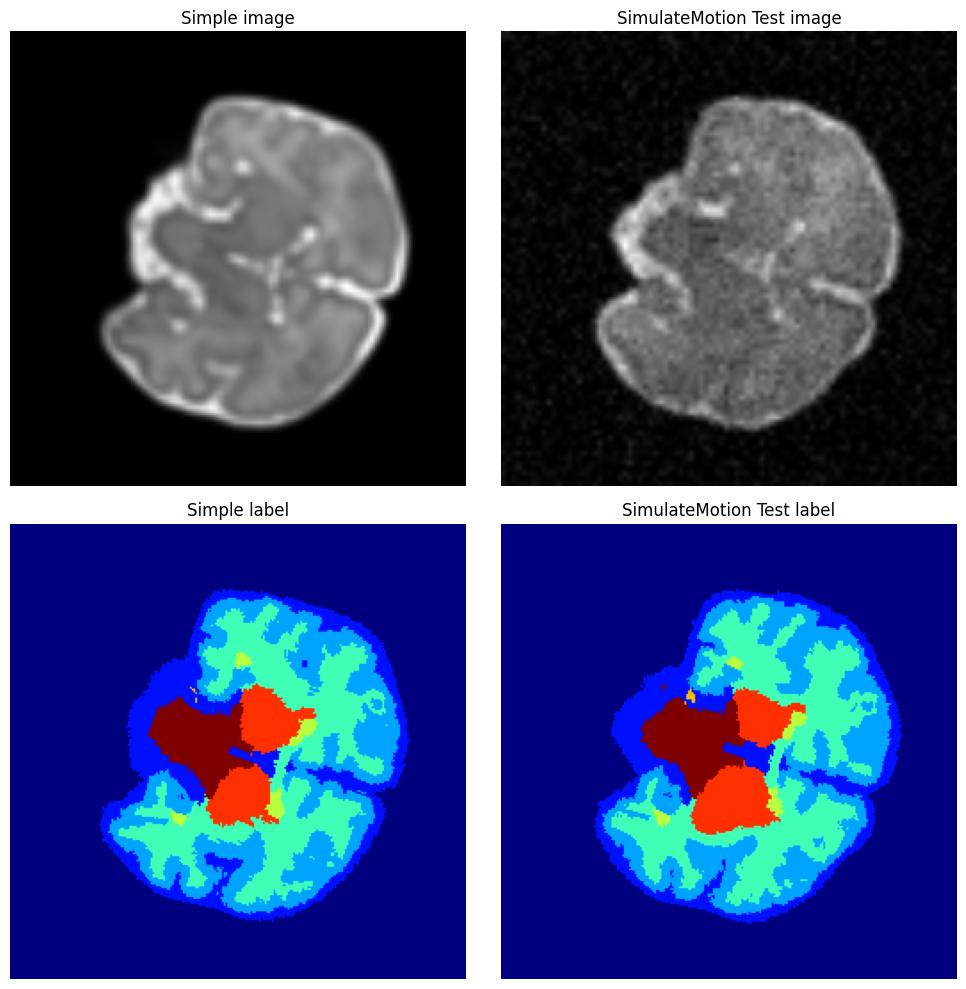

Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 53.92631912231445 mean 20.97834014892578 shape torch.Size([256, 256, 256])
{'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.9232188466199582, 'slice_thickness': 2.600166341537701, 'gap': 2.288566657975547, 'nstacks': 2, 'smooth_volume_on': False, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 2}}
Simple image generation time: 0.3230881690979004
SimulateMotion image generation time: 0.8891284465789795


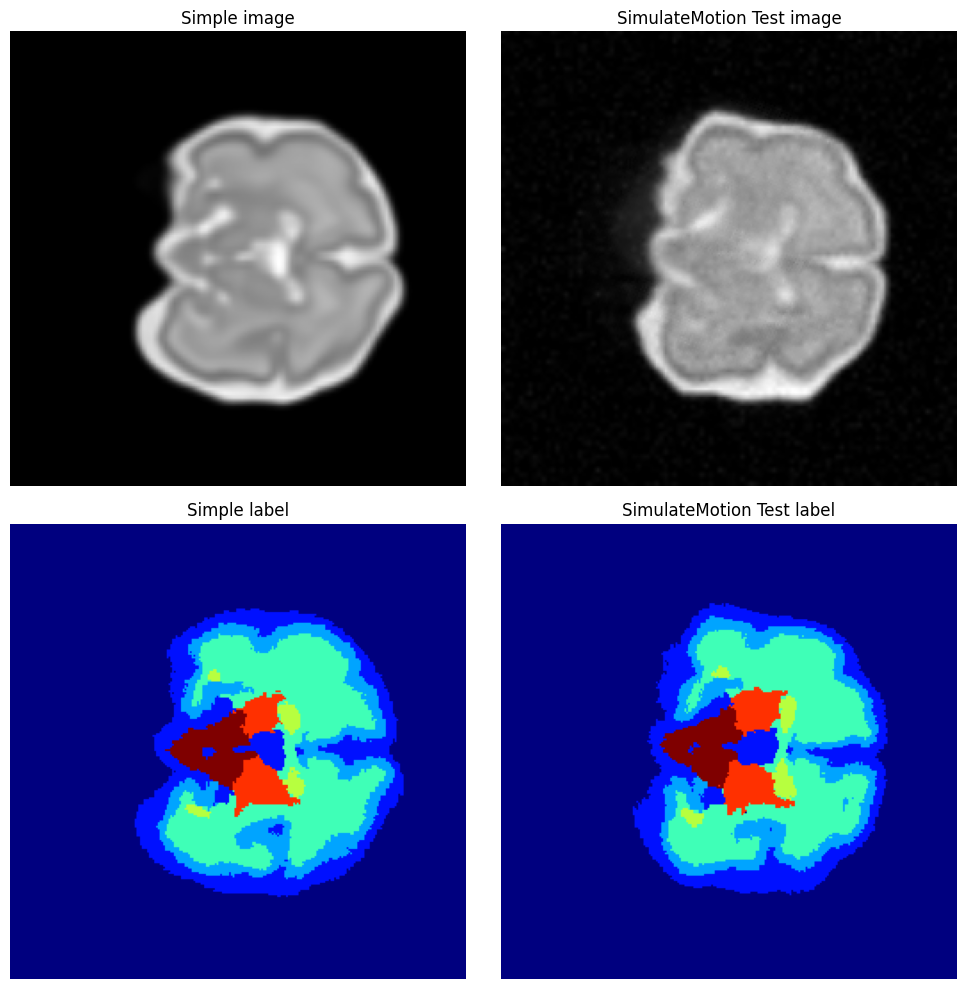

Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
Output max: 255.0 min 0.0 std 30.85257911682129 mean 6.422808647155762 shape torch.Size([256, 256, 256])
{'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.8377334092092519, 'slice_thickness': 4.955807588011961, 'gap': 1.9795787908599838, 'nstacks': 4, 'smooth_volume_on': False, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [False, False, False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 2}}
Simple image generation time: 0.2667205333709717
SimulateMotion image generation time: 2.3586504459381104


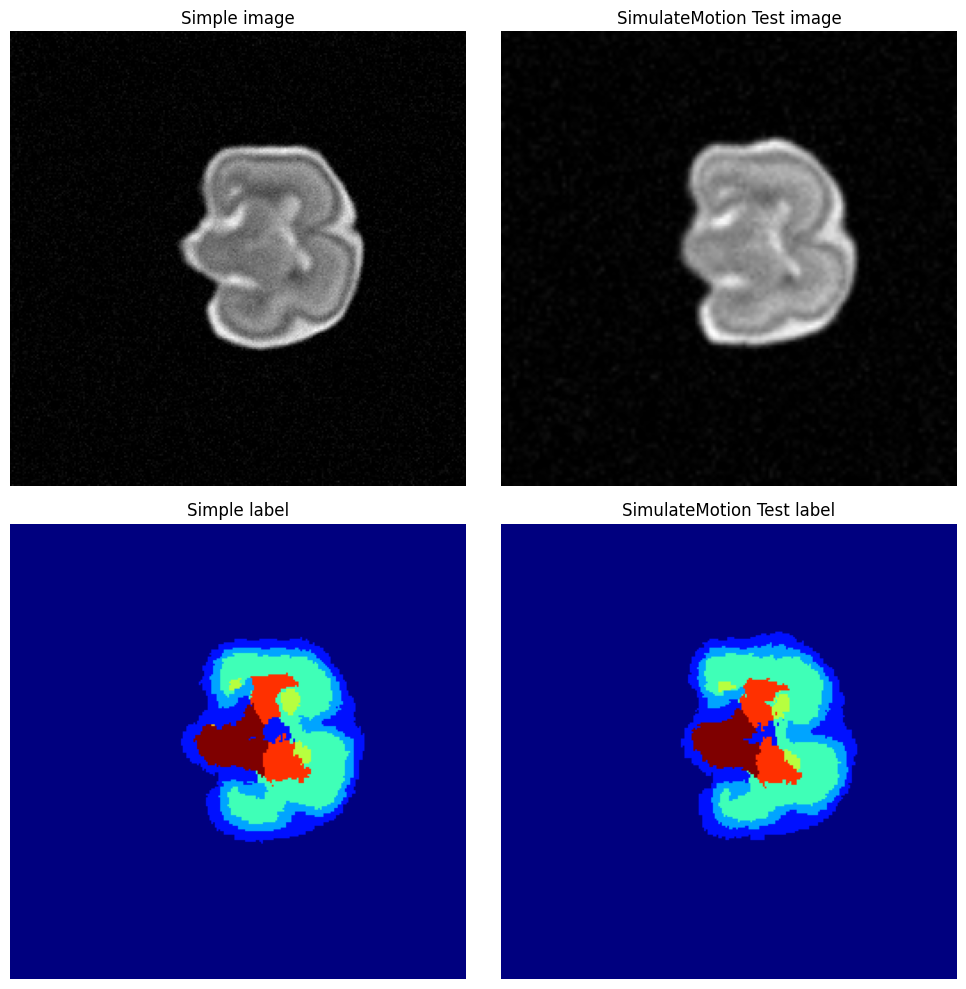

In [7]:
# Instantiate ScannerParams
scanner_params = ScannerParams(
    resolution_slice_fac_min=0.5,
    resolution_slice_fac_max=2,
    resolution_slice_max=1.5,
    slice_thickness_min=1.5,
    slice_thickness_max=5,
    gap_min=1.5,
    gap_max=4.5,
    min_num_stack=2,
    max_num_stack=6,
    max_num_slices=250,
    noise_sigma_min=0,
    noise_sigma_max=0.1,
    TR_min=1,
    TR_max=2,
    prob_gamma=0.1,
    gamma_std=0.05,
    prob_void=0.2,
    slice_size=None,
    restrict_transform=False,
    txy=3.0,
)

# Instantiate ReconParams
recon_params = ReconParams(
    prob_misreg_slice=0.1,
    slices_misreg_ratio=0.1,
    prob_misreg_stack=0.1,
    txy=5,
    prob_merge=0.8,
    merge_ngaussians_min=2,
    merge_ngaussians_max=4,
    prob_smooth=0.2,
    prob_rm_slices=0.3,
    rm_slices_min=0.1,
    rm_slices_max=0.4,
)

# Instantiate SimulateMotion
simulate_motion = SimulateMotion(
    prob=1, scanner_params=scanner_params, recon_params=recon_params
)


# SR ARTIFACTS CLASSES

# Instantiate BlurCortex
test_name = "SimulateMotion"
# Instantiate SimulatedBoundaries

test_gen = FetalSynthGen(
    shape=(256, 256, 256),
    resolution=(0.5, 0.5, 0.5),
    device="cuda:0",
    intensity_generator=intensity_generator,
    spatial_deform=spatial_deform,
    resampler=resampler,
    bias_field=bias_field,
    noise=noise,
    gamma=gamma,
    simulate_motion=simulate_motion,
)

test_dataset = FetalSynthDataset(
    bids_path="./../data",
    generator=test_gen,
    seed_path=None,#"./../data/derivatives/seeds",
    load_image=True,
    image_as_intensity=True,
    sub_list=None,
)

for j in range(3):
    for i in range(3):
        simple_sample = simple_real_ds.sample_with_meta(i)
        test_sample = test_dataset.sample_with_meta(
            i, simple_sample["generation_params"]
        )
        print(test_sample['generation_params']['artifacts'])

        plot_sidebyside(simple_sample, test_sample, test_name)